In [ ]:
import numpy as np
import os

import comet_ml #must be before torch

import torch
from torch import nn
import torch.nn.functional as F
from torch.optim.optimizer import Optimizer, required

from torchvision.datasets import MNIST
from torch.utils.data import DataLoader, random_split
from torchvision import transforms

import pytorch_lightning as pl
from pytorch_lightning import Trainer
from pytorch_lightning.loggers import CometLogger

from typing import Any, Callable, Dict, Optional, Sequence, Tuple, Union, List

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

from collections import namedtuple
from functools import partial

from helper import ReshapeTransform

from datetime import datetime

## 1. Data

In [2]:
#Load (normalized) MNIST dataset, split into train/validation/test, reshape to 1D vectors.

#From: https://pytorch-lightning.readthedocs.io/en/latest/extensions/datamodules.html
class MNISTDataModule(pl.LightningDataModule):
    
    def __init__(self,
                 data_dir : str = os.getcwd(),
                 train_batch_size : int = 100,
                 test_batch_size  : int = 1000):
        
        super().__init__()
        
        #---Store arguments---#
        self.data_dir = data_dir
        self.train_batch_size = train_batch_size
        self.test_batch_size  = test_batch_size
        
        #---Transforms---#
        self.transforms = transforms.Compose([
            transforms.ToTensor(),
            ReshapeTransform((-1,)),
            #transforms.Lambda(lambda x: x.double()),
        ])
        
        self.dims = (28**2,)
        
    def setup(self, stage : Optional[str] = None):
        if stage == 'fit' or stage is None:
            mnist_full = MNIST(self.data_dir, train=True, transform=self.transforms)
            self.mnist_train, self.mnist_val = random_split(mnist_full, [50000, 10000]) #Train/Validation split
        
        if stage == 'test' or stage is None:
            self.mnist_test  = MNIST(self.data_dir, train=False, transform=self.transforms)

    def train_dataloader(self):
        return DataLoader(self.mnist_train, batch_size=self.train_batch_size, pin_memory=True, shuffle=True)
    
    def val_dataloader(self):
        return DataLoader(self.mnist_val, batch_size=self.test_batch_size, pin_memory=True)
    
    def test_dataloader(self):
        return DataLoader(self.mnist_test, batch_size=self.test_batch_size, pin_memory=True)


## 2. Optimizer

In [3]:
class Local(Optimizer):
    """
    A simple optimizer that changes weights according to `weights += learning_rate * delta_weights`,
    for a provided `delta_weights`, automatically retrieving the `learning_rate` from each layer metadata.
    
    Taken from: https://github.com/Joxis/pytorch-hebbian/blob/595ec79577c3816c61d39b0633f8dbf14d28b67a/pytorch_hebbian/optimizers/local.py#L15
    """
    
    def __init__(self, named_params, lr=required):
        self.param_names, params = zip(*named_params)
        
        if lr is not required and lr < 0.0: #?
            raise ValueError("Invalid learning rate: {}".format(lr))
    
        defaults = dict(lr=lr)
        super(Local, self).__init__(params, defaults)
    
    def local_step(self, delta_weights, layer_name, closure=None):
        """Performs a single local optimization step: weights += learning_rate * delta_weights.
        The needed learning_rate is automatically retrieved from the layer metadata."""
        
        loss = None
        if closure is not None:
            loss = closure()
            
        for group in self.param_groups:
            layer_index = self.param_names.index(layer_name + '.weight') #find index of layer
            weights = group['params'][layer_index]
            #print('lr', group['lr'])
            weights.data.add_(group['lr'] * delta_weights)
            #print("Add weights to ", layer_index)
        
        try:
            self._step_count += 1
        except AttributeError:
            pass
        
        return loss

## 3. Learning Rule

In [4]:
class BioLearningRule():
    """
    Implements the bio-inspired Hebbian learning rule from [1]. 
    
    Adapted from https://github.com/Joxis/pytorch-hebbian/blob/master/pytorch_hebbian/learning_rules/krotov.py
    
    [1]: "Unsupervised learning by competing hidden units", D. Krotov, J. J. Hopfield, 2019, 
         https://www.pnas.org/content/116/16/7723
    """
    
    def __init__(self,
                 precision     : float = 1e-30,
                 delta         : float = 0.4,
                 lebesgue_p    : float = 2.0, 
                 ranking_param : int   = 2):
        """
        Parameters
        ----------
        precision : float
            Minimum value that is considered non-zero.
        delta : float
            Strength of anti-Hebbian learning (from eq. 9 in [1]). 
        lebesgue_p : float
            Parameter for Lebesgue measure, used for defining an inner product (from eq. 2 in [1]).
        ranking_param: int
            Rank of the current to which anti-hebbian learning is applied. Should be >= 2. 
            This is the `k` from eq. 10 in [1].
        """
        
        #Store hyperparameters
        self.precision     = precision
        self.delta         = delta
        self.lebesgue_p    = lebesgue_p
        self.ranking_param = ranking_param
        
        print(self)
        
    def __str__(self):
        """Return string representation of the object"""
        
        return "Krotov-Hopfield Hebbian learning rule (delta={:.2f}, lebesgue_p={:.2f}, ranking_param={})".format(self.delta, self.lebesgue_p, self.ranking_param)
    
    def __repr__(self):
        """Return string representation of the object"""
        
        return str(self)
    
    def __call__(self,
                 inputs  : torch.Tensor,
                 weights : torch.Tensor) -> torch.tensor:
        """
        Compute the change of `weights` given by the Krotov learning rule (eq. 3 from [1], with R=1)
        for a given batch of `inputs`. See "A fast implementation" section in [1].
        
        The formula is:
        ```delta_weights = g(currents) @ inputs - normalization_mtx (*) weights
        currents = (sgn(weights) (*) abs(weights) ** lebesgue_p) @ inputs.T```
        
        where `normalization_mtx` is a matrix of the same shape of `weights`, with all columns equal to:
        ```\sum_{batches} [g(currents) (*) currents]```
        
        The symbol `@` denotes matrix multiplication, while `(*)` is element-wise multiplication (Hadamard product).
        Finally, the function `g` (eq. 10 in [1]) returns:
        ```g(currents[i,j]) = 1      if currents[i,j] is the highest in the j-th column (sample),
                              -Delta if currets[i,j] is the k-th highest value in the j-th column (sample),
                               0     otherwise```
        
         
        Parameters
        ----------
        inputs : torch.Tensor of shape (batch_size, input_size)
            Batch of inputs
        weights : torch.Tensor of shape (output_size, input_size)
            Model's weights
        
        Returns
        -------
        delta_weights : torch.Tensor of shape (output_size, input_size)
            Change of weights given by the fast implementation of Krotov learning rule. The tensor is normalized
            so that its maximum is equal to 1.
        """
        
        #TODO: Add compatibility with Conv2d by using an argument?
                
        batch_size = inputs.shape[0]
        
        #---Currents---#
        inputs = torch.t(inputs) #Shape is (batch_size, input_size) -> (input_size, batch_size)
        currents = torch.matmul(torch.sign(weights) * torch.abs(weights) ** (self.lebesgue_p - 1), inputs) #Shape is (output_size, batch_size)
        
        #---Activations---#
        _, ranking_indices = currents.topk(self.ranking_param, dim=0) #Shape is (self.ranking_param, batch_size)
        #Indices of the top k currents produced by each input sample
        
        post_activation_currents = torch.zeros_like(currents) #Shape is (output_size, batch_size)
        #Computes g(currents)
        #Note that all activations are 0, except the largest current (activation of 1) and the k-th largest (activation of -delta)        
        
        batch_indices = torch.arange(batch_size, device=post_activation_currents.device) 
        post_activation_currents[ranking_indices[0], batch_indices] = 1.0
        post_activation_currents[ranking_indices[self.ranking_param-1], batch_indices] = -self.delta
        
        #---Compute change of weights---#
        delta_weights = torch.matmul(post_activation_currents, torch.t(inputs)) #Overlap between post_activation_currents and inputs
        second_term   = torch.sum(torch.mul(post_activation_currents, currents), dim=1) #Overlap between currents and post_activation_currents
        #Results are summed over batches, resulting in a shape of (output_size,)        
        
        delta_weights = delta_weights - second_term.unsqueeze(1) * weights
        
        #---Normalize---#
        nc = torch.max(torch.abs(delta_weights)) 
        if nc < self.precision:
            nc = self.precision
        
        return delta_weights / nc #Maximum (absolute) change of weight is set to +1. 

## 4. Model

In [5]:
class Net(nn.Module):
    
    def __init__(self, 
                 input_dim : int = 28*28,
                 output_dim : int = 10,
                 num_hidden : int = 2000,
                 n : int = 4.5,
                 beta : float = .1):
        """Builds the neural network architecture presented in [1].

        Parameters
        ----------
        input_dim : int
            Input dimensionality
        output_dim : int
            Output dimensionality (number of classes)
        num_hidden : int
            Number of hidden units
        n : int
            Exponent of activation function for the first hidden layer (n = 1 for ReLU). See eq. 1 in [1].
        beta : float
            Parameter for the activation function in the top layer (akin to an "inverse temperature"). See eq. 1 in [1].         
        
        [1]: "Unsupervised learning by competing hidden units", D. Krotov, J. Hopfield, 2019
        """
        
        super(Net, self).__init__()
        
        #Store parameters
        self.n = n
        self.beta = beta
        
        #Define layers
        self.num_hidden = num_hidden
        self.hidden = nn.Linear(input_dim, self.num_hidden, bias=False)
        self.top    = nn.Linear(self.num_hidden, output_dim, bias=False)
        
    def forward(self, x : torch.Tensor) -> torch.Tensor:
        """
        Compute the output of the network for the input `x`.
        
        Parameters
        ----------
        x : torch.Tensor of shape (batch_size, self.input_dim)
            Batch of input values
        
        Returns
        -------
        out : torch.Tensor of shape (batch_size, self.output_dim)
            Batch of output values
        """
        
        x = F.relu(self.hidden(x))**self.n
        x = torch.tanh(self.beta * self.top(x))
        
        return x

## 5. Unsupervised Learning

In [7]:
class UnsupervisedPhase(pl.LightningModule):
    """
    Perform unsupervised learning of the first layers of a sequential network according to some local learning rule.
    """

    #TODO add learning rate scheduler
    
    def __init__(self,
                 model               : torch.nn.Sequential,
                 update_weights_rule : Callable,
                 supervised_from     : int = -1,
                 freeze_layers       : List[str] = None,
                 n_epochs            : int = 100,
                 lr                  : float = 0.02
                ):
        """
        Parameters
        ----------
        model : torch.nn.Sequential
            Model to be trained. Must be a sequence of Linear layers (+ some activations).
        update_weights_rule : function
            Function that computes the change of weights
        supervised_from : int
            Train all layers that appear *before* `supervised_from`. By default, all layers except the very last one are trained.
        freeze_layers : list of strings
            Names of layers to be excluded from training.
        n_epochs : int
            Number of epochs for the full training (needed to set the learning rate)
        lr : float
            Initial Learning Rate
        """
        
        super().__init__()
        
        #---Store arguments---#
        self.model           = model
        self.supervised_from = supervised_from
        self.freeze_layers   = freeze_layers
        self.update_weights_rule = update_weights_rule
        self.n_epochs = n_epochs
        self.lr = lr
        
        if self.freeze_layers is None:
            self.freeze_layers = []
            
        self.layers = [] #Save all layers that need to be trained
        Layer = namedtuple('Layer', ['idx', 'name', 'layer']) #simple object to store layer metadata
        
        for idx, (name, layer) in enumerate(list(model.named_children())[:self.supervised_from]):
            if (type(layer) == torch.nn.Linear) and name not in self.freeze_layers:
                self.layers.append(Layer(idx, name, layer))
                
                layer.weight.data.normal_(mean=0.0, std=1.0) #and initialize weights with normal distribution
        
        print("Layers selected for unsupervised local (bio)learning:")
        print("{} layer(s): ".format(len(self.layers)), [lyr.name for lyr in self.layers])
        
        #Register hooks in trainable layers so that input/output can be stored (which is needed for Hebbian learning)
        self._hooks = {} 
        self._inputs = {}
        self._outputs = {}
        
        for layer in self.layers:
            self._hooks[layer.name] = layer.layer.register_forward_hook(
                partial(self._store_data_hook, layer_name=layer.name)
            )
            
        self.automatic_optimization = False #Disable automatic gradient optimizations 
        #(since we are using a local optimizer, which does not need any gradient)
        
    def forward(self, x : torch.Tensor):
        """Compute model output"""
        
        return self.model.forward(x)
    
    def _store_data_hook(self, _, inp, out, layer_name):
        """Hook for storing input/outputs of trainable layers"""
        
        #print("Hook called with name: ", layer_name)
        self._inputs[layer_name] = inp[0]
        self._outputs[layer_name] = out
        
    def training_step(self, batch : torch.Tensor, batch_idx : int):
        """
        Single iteration of the training cycle.
        """
        
        opt = self.optimizers() #Retrieve the optimizer
        
        with torch.no_grad(): #No gradient is needed
            x, y = batch
            
            #---Forward step---#
            layers = list(self.model.children())
            for layer in layers[:self.supervised_from]: 
                x = layer(x)
            
            #---Unsupervised learning---#
            for layer_idx, layer_name, layer in self.layers:
                inputs = self._inputs[layer_name]
                    
                weights = layer.weight
                
                #Compute change of weights
                delta_weights = self.update_weights_rule(inputs, weights)
                delta_weights = delta_weights.view(*layer.weight.size()) #Flatten
                
                #Update weights
                opt.local_step(delta_weights, layer_name=layer_name)
                
        return x, y
        
    def configure_optimizers(self):
        """Define optimizer and learning rate schedule."""
        
        start_lr = self.lr
        optimizer = Local(named_params = self.model.named_parameters(), lr=start_lr)
        lr_scheduler = torch.optim.lr_scheduler.LambdaLR(optimizer, lambda epoch : (self.n_epochs - epoch) / self.n_epochs,
                                                         verbose=True)
        
        return [optimizer], [lr_scheduler]

In [8]:
class VisualizationCallbacks(pl.Callback):
    """
    Interface with the comet.ml logger to visualize weights during training, and store all hyperparameters of a run.
    """
    
    def __init__(self):
        self.step_frequency = 250 #Visualize weights every `self.step_frequency` training steps.
    
    @staticmethod
    def draw_weights(weights : np.ndarray,
                     reshape_dim : Tuple[int, int] = (28, 28),
                     max_per_row : int = 5,
                     max_rows : int = 5,
                     epoch : int = -1):
        """
        Plot the first few weights as matrices. `weights` should be an array of shape (output_dim, input_dim), i.e.
        `weights[i,j]` is the weight connecting the $j$-th neuron of a layer $n$ to the $i$-th neuron of the $n+1$ layer.
        Namely, all the weights connected to the $i$-th output neuron are the ones in the $i$-th row of `weights`.
        These weights are reshaped according to `reshape_dim` to construct a matrix. The weight matrices of the first neurons
        are then plotted in a grid of up to `max_rows` rows and `max_per_row` columns. 
        """

        #Shape of weights is (output_dim, input_dim)
        fig = plt.figure()
        nc = np.max(np.abs(weights)) #(Absolute) range of weights

        n_neurons = weights.shape[0] 

        #---Infer number of rows/columns---#
        n_columns = max_per_row
        n_rows = n_neurons // max_per_row

        if n_rows > max_rows:
            n_rows = max_rows
        if n_rows == 1:
            n_columns = n_neurons
        if n_neurons > max_rows * max_per_row:
            n_neurons = max_rows * max_per_row

        #---Generate grid---#
        whole_image = np.zeros(reshape_dim * np.array([n_rows, n_columns]))

        i_row = 0
        i_col = 0
        size_x, size_y = reshape_dim

        plt.clf() #Clear figure
        plt.tight_layout()

        for index_neuron in range(n_neurons):
            img = weights[index_neuron,...].reshape(reshape_dim)
            whole_image[i_row * size_x:(i_row+1) * size_x,i_col * size_y:(i_col+1) * size_y] = img
            i_col += 1

            if (i_col >= n_columns):
                i_col = 0
                i_row += 1

        #---Plot---#
        img_plotted = plt.imshow(whole_image, cmap='bwr', vmin=-nc, vmax=nc, interpolation=None)
        fig.colorbar(img_plotted,ticks=[np.amin(whole_image), 0, np.amax(whole_image)])

        plt.axis('off')
        plt.show()
        
        fig.savefig(f"figs/unsupervised/weights{epoch}.png", transparent=True, bbox_inches='tight') #Save images for animation
        
        return fig
    
    def on_batch_end(self, trainer, pl_module):
        """
        Draw weights every `self.step_frequency` iterations.
        """
        
        epoch = trainer.current_epoch
        global_step = trainer.global_step
        
        if global_step % self.step_frequency == 0:
            weights = pl_module.model.hidden.weight.detach().cpu().numpy()
            norms = np.sum(np.abs(weights) ** (pl_module.update_weights_rule.lebesgue_p), axis=1)
            print('Normalizations: ', np.mean(norms), ' +- ', np.std(norms))
            fig = self.draw_weights(weights, epoch=epoch)
            pl_module.logger.experiment.log_figure(figure_name="weights", figure=fig, step=global_step)     
            plt.close()
            
        

    def on_train_start(self, trainer, pl_module):
        """
        Store the hyperparameters at the start of training.
        """
        
        pl_module.logger.experiment.log_parameters(
            {'delta': pl_module.update_weights_rule.delta,
             'ranking_param': pl_module.update_weights_rule.ranking_param,
             'lebesgue_p': pl_module.update_weights_rule.lebesgue_p,
             'n': pl_module.model.n,
             'beta' : pl_module.model.beta,
             'arch' : str(pl_module.model)
             }
        )

## Training

In [9]:
#---Logger---#
#Logs hyperparameters and visualizations on an online server. Requires a free comet.ml account (https://www.comet.ml/).
#The personal api_key should be inserted below.
#The model can run also without the logger: it suffices to remove "callbacks=[visualization]" from the trainer definition.

# comet_logger = CometLogger(
#     api_key="<my_api_key>",
#     project_name="my_project",
#     workspace="my_workspace",
#     experiment_name="unsupervised_biolearning"
# )

visualization = VisualizationCallbacks()

trainer = Trainer(gpus=[0], callbacks=[visualization], max_epochs=200) #Remove gpus=[0] to train using CPU only
#Add logger=comet_logger to log with comet.ml

CometLogger will be initialized in online mode
GPU available: True, used: True
TPU available: None, using: 0 TPU cores


In [10]:
mnist = MNISTDataModule(train_batch_size=100) #Data
update_weights_rule = BioLearningRule(delta=0.40, lebesgue_p=2, ranking_param=2) #Learning rule
net = Net(28**2, 10, num_hidden=2000) #.double() #Model
print(net)
print(next(net.parameters()).dtype)



Krotov-Hopfield Hebbian learning rule (delta=0.40, lebesgue_p=2.00, ranking_param=2)
Net(
  (hidden): Linear(in_features=784, out_features=2000, bias=False)
  (top): Linear(in_features=2000, out_features=10, bias=False)
)
torch.float32


In [11]:
full_system = UnsupervisedPhase(model=net, update_weights_rule=update_weights_rule, n_epochs=trainer.max_epochs, lr=.02) #Assemble!

Layers selected for unsupervised local (bio)learning:
1 layer(s):  ['hidden']


C:\Users\franc\Anaconda3\envs\torch\lib\site-packages\pytorch_lightning\utilities\distributed.py:50: UserWarning: you passed in a val_dataloader but have no validation_step. Skipping validation loop
  warnings.warn(*args, **kwargs)


Adjusting learning rate of group 0 to 2.0000e-02.


COMET INFO: Experiment is live on comet.ml https://www.comet.ml/einlar/qlsproject/c689ccb367f14ebe8b2c9554ff2a56de

COMET WARNING: Empty mapping given to log_params({}); ignoring

  | Name  | Type | Params
-------------------------------
0 | model | Net  | 1.6 M 
-------------------------------
1.6 M     Trainable params
0         Non-trainable params
1.6 M     Total params
6.352     Total estimated model params size (MB)


Training: 0it [00:00, ?it/s]

Normalizations:  784.66077  +-  39.13172


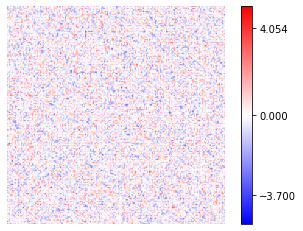

Normalizations:  765.28455  +-  64.2487


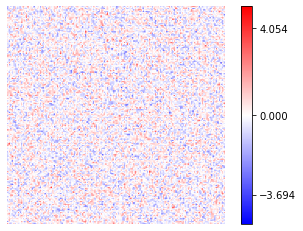

C:\Users\franc\Anaconda3\envs\torch\lib\site-packages\torch\optim\lr_scheduler.py:129: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn("Detected call of `lr_scheduler.step()` before `optimizer.step()`. "


Adjusting learning rate of group 0 to 1.9900e-02.
Normalizations:  740.8982  +-  92.723656


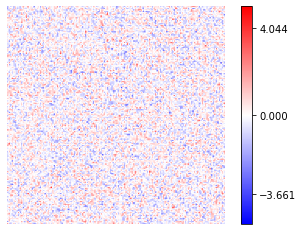

Normalizations:  715.50183  +-  116.67048


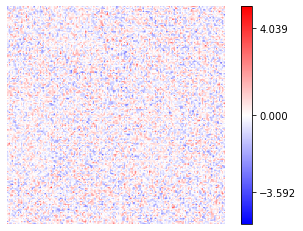

Adjusting learning rate of group 0 to 1.9800e-02.
Normalizations:  689.84875  +-  135.69374


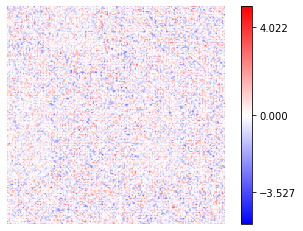

Normalizations:  663.7781  +-  151.53877


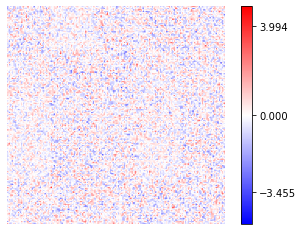

Adjusting learning rate of group 0 to 1.9700e-02.
Normalizations:  637.6664  +-  164.8195


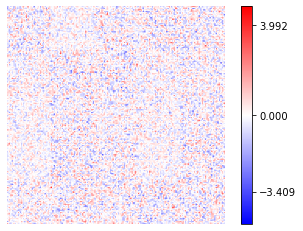

Normalizations:  612.25085  +-  175.3899


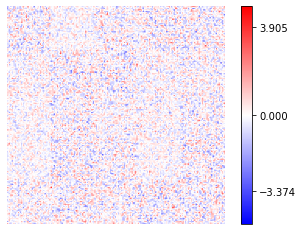

Adjusting learning rate of group 0 to 1.9600e-02.
Normalizations:  587.10004  +-  183.94672


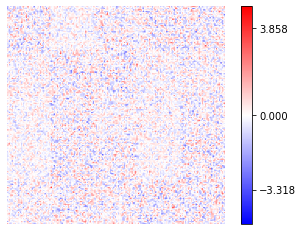

Normalizations:  562.7202  +-  190.90105


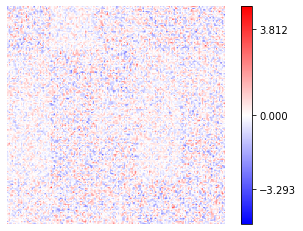

Adjusting learning rate of group 0 to 1.9500e-02.
Normalizations:  538.42816  +-  196.39006


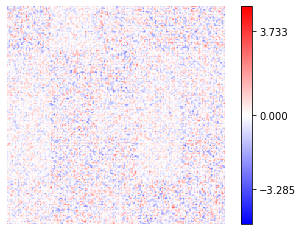

Normalizations:  514.49023  +-  200.63579


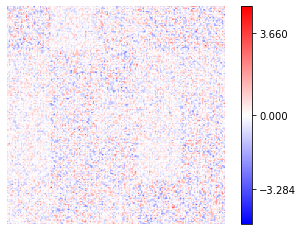

Adjusting learning rate of group 0 to 1.9400e-02.
Normalizations:  491.5788  +-  203.3547


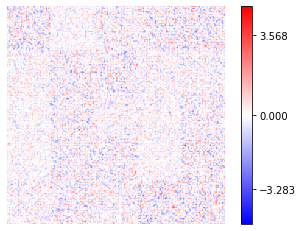

Normalizations:  468.94968  +-  205.23004


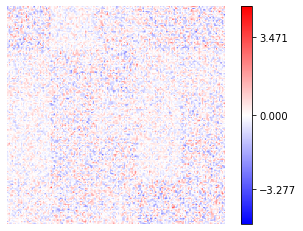

Adjusting learning rate of group 0 to 1.9300e-02.
Normalizations:  446.9784  +-  206.07053


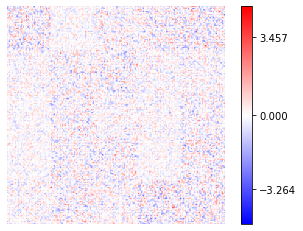

Normalizations:  425.59494  +-  206.01237


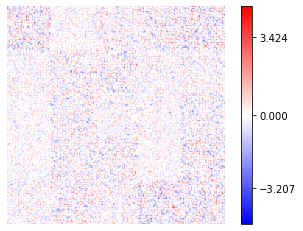

Adjusting learning rate of group 0 to 1.9200e-02.
Normalizations:  405.0882  +-  205.03706


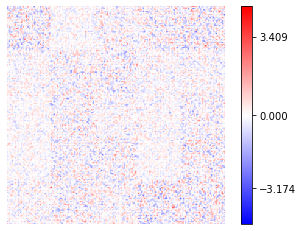

Normalizations:  384.6606  +-  203.70033


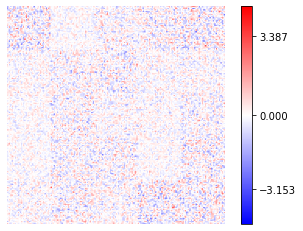

Adjusting learning rate of group 0 to 1.9100e-02.
Normalizations:  364.61115  +-  201.10966


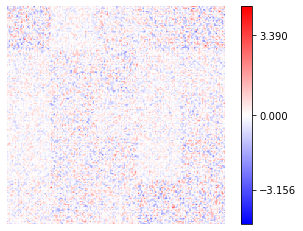

Normalizations:  345.56375  +-  198.25488


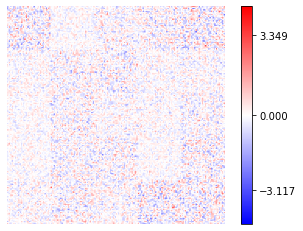

Adjusting learning rate of group 0 to 1.9000e-02.
Normalizations:  327.5007  +-  195.07693


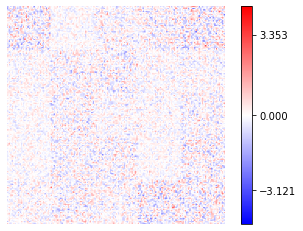

Normalizations:  310.1493  +-  191.40642


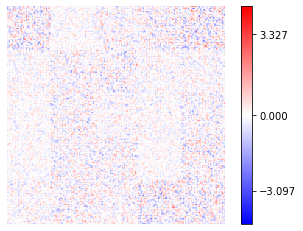

Adjusting learning rate of group 0 to 1.8900e-02.
Normalizations:  293.11267  +-  187.39105


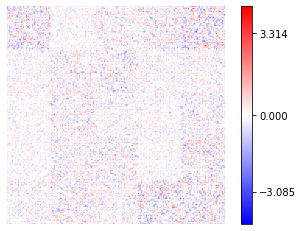

Normalizations:  276.62286  +-  182.91039


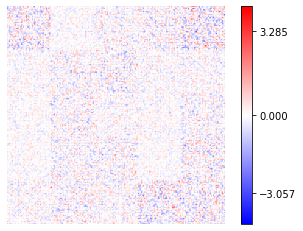

Adjusting learning rate of group 0 to 1.8800e-02.
Normalizations:  260.81177  +-  178.1837


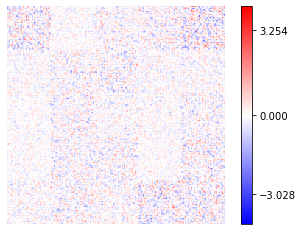

Normalizations:  245.42093  +-  173.04305


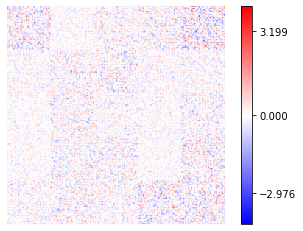

Adjusting learning rate of group 0 to 1.8700e-02.
Normalizations:  230.97946  +-  168.00255


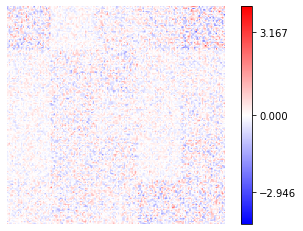

Normalizations:  217.04108  +-  162.83447


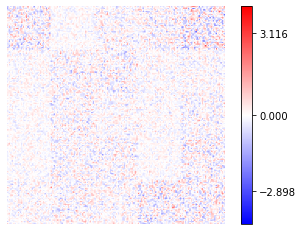

Adjusting learning rate of group 0 to 1.8600e-02.
Normalizations:  203.75847  +-  157.27844


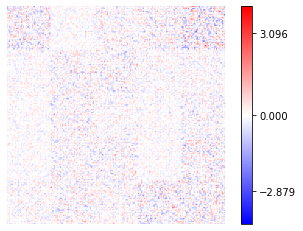

Normalizations:  191.13225  +-  151.87917


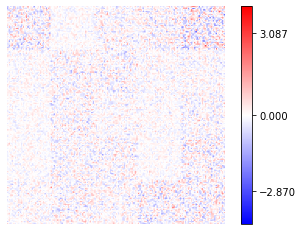

Adjusting learning rate of group 0 to 1.8500e-02.
Normalizations:  179.07916  +-  146.64673


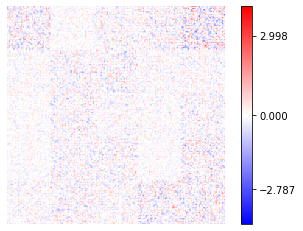

Normalizations:  167.36935  +-  141.31361


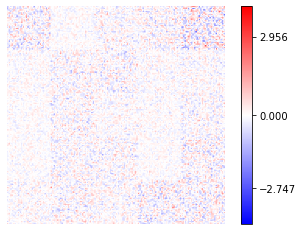

Adjusting learning rate of group 0 to 1.8400e-02.
Normalizations:  156.24356  +-  136.08003


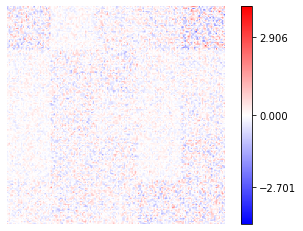

Normalizations:  145.81194  +-  130.77205


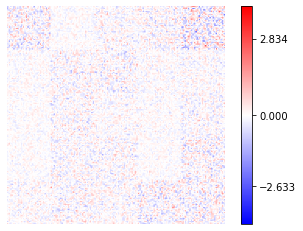

Adjusting learning rate of group 0 to 1.8300e-02.
Normalizations:  135.82248  +-  125.77099


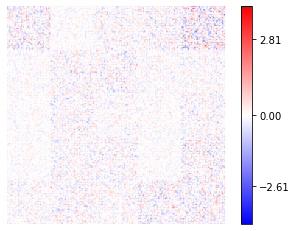

Normalizations:  126.34501  +-  120.71388


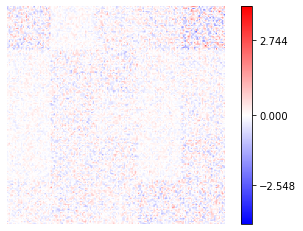

Adjusting learning rate of group 0 to 1.8200e-02.
Normalizations:  117.3647  +-  115.5004


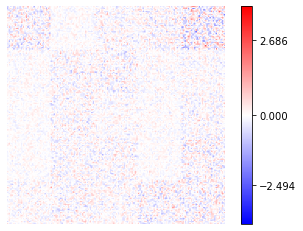

Normalizations:  108.87033  +-  110.513374


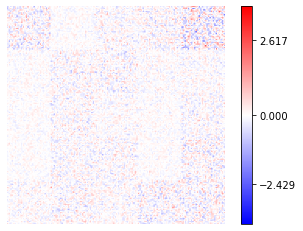

Adjusting learning rate of group 0 to 1.8100e-02.
Normalizations:  100.75386  +-  105.6982


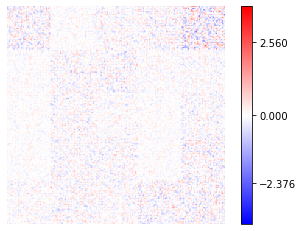

Normalizations:  93.25457  +-  100.9822


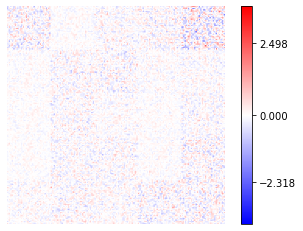

Adjusting learning rate of group 0 to 1.8000e-02.
Normalizations:  86.04835  +-  96.47416


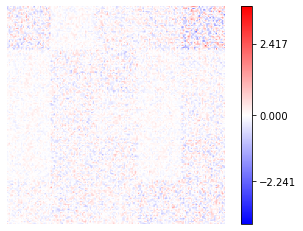

Normalizations:  79.43792  +-  92.20971


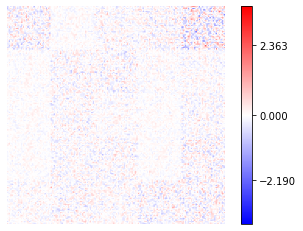

Adjusting learning rate of group 0 to 1.7900e-02.
Normalizations:  72.94785  +-  87.7522


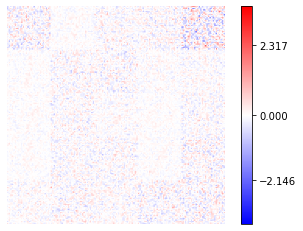

Normalizations:  67.029205  +-  83.712234


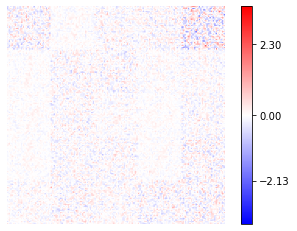

Adjusting learning rate of group 0 to 1.7800e-02.
Normalizations:  61.503544  +-  79.79748


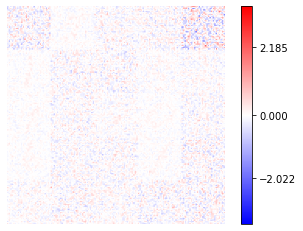

Normalizations:  56.448784  +-  75.7418


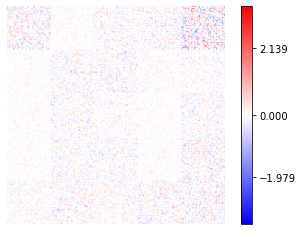

Adjusting learning rate of group 0 to 1.7700e-02.
Normalizations:  51.662533  +-  72.30678


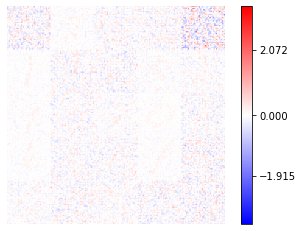

Normalizations:  47.182743  +-  68.68033


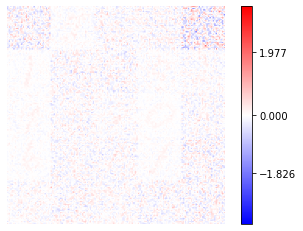

Adjusting learning rate of group 0 to 1.7600e-02.
Normalizations:  43.05846  +-  65.32329


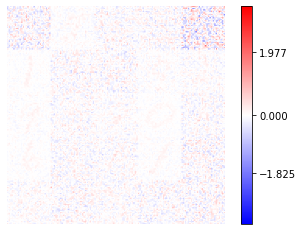

Normalizations:  39.340717  +-  62.075413


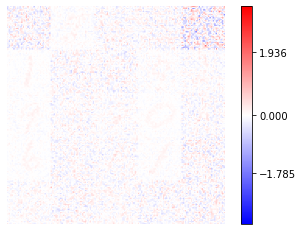

Adjusting learning rate of group 0 to 1.7500e-02.
Normalizations:  35.81364  +-  59.13499


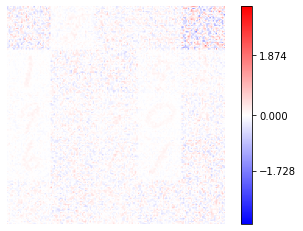

Normalizations:  32.61239  +-  56.515987


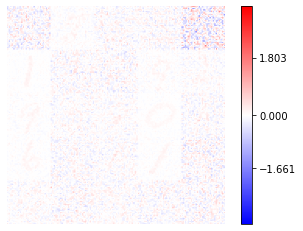

Adjusting learning rate of group 0 to 1.7400e-02.
Normalizations:  29.60677  +-  53.405148


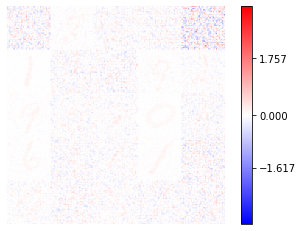

Normalizations:  26.886452  +-  51.02211


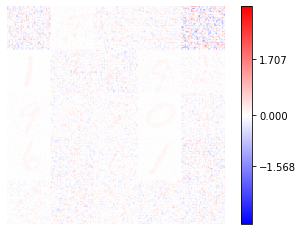

Adjusting learning rate of group 0 to 1.7300e-02.
Normalizations:  24.435785  +-  48.452682


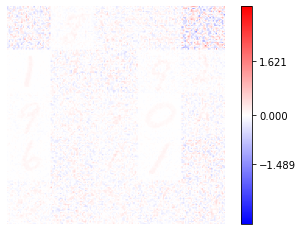

Normalizations:  22.179193  +-  46.041275


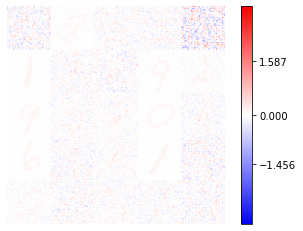

Adjusting learning rate of group 0 to 1.7200e-02.
Normalizations:  20.169924  +-  43.98011


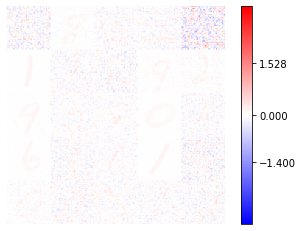

Normalizations:  18.370226  +-  42.09981


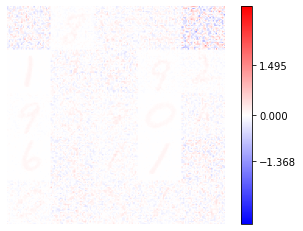

Adjusting learning rate of group 0 to 1.7100e-02.
Normalizations:  16.698687  +-  40.2765


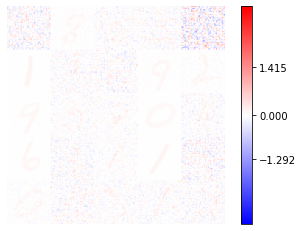

Normalizations:  15.242728  +-  38.579876


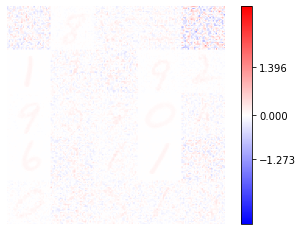

Adjusting learning rate of group 0 to 1.7000e-02.
Normalizations:  13.883503  +-  36.978336


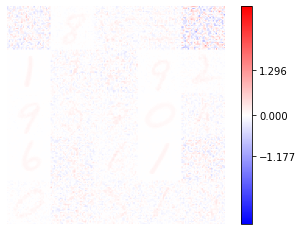

Normalizations:  12.683844  +-  35.484653


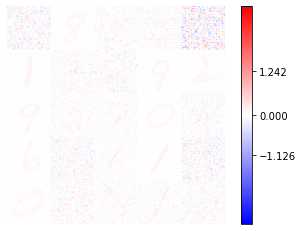

Adjusting learning rate of group 0 to 1.6900e-02.
Normalizations:  11.602368  +-  34.05647


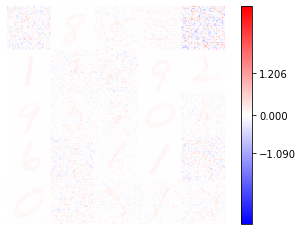

Normalizations:  10.617867  +-  32.691296


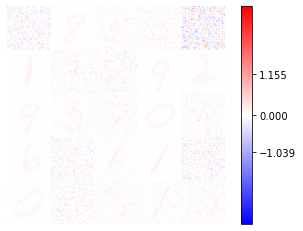

Adjusting learning rate of group 0 to 1.6800e-02.
Normalizations:  9.763093  +-  31.289183


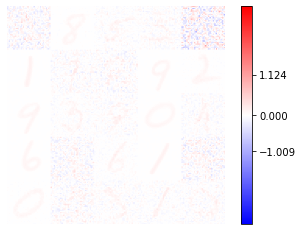

COMET ERROR: File could not be uploaded


Normalizations:  8.974691  +-  29.92185


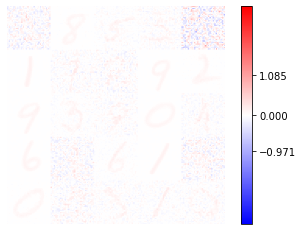

Adjusting learning rate of group 0 to 1.6700e-02.
Normalizations:  8.266392  +-  28.627901


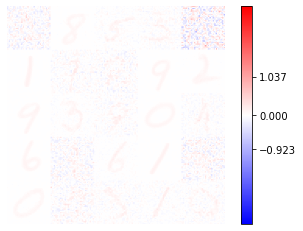

Normalizations:  7.6328506  +-  27.569199


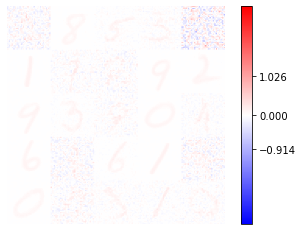

Adjusting learning rate of group 0 to 1.6600e-02.
Normalizations:  7.0548525  +-  26.29281


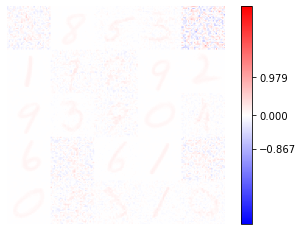

Normalizations:  6.5238132  +-  25.091131


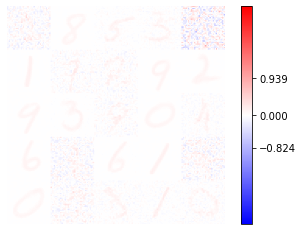

Adjusting learning rate of group 0 to 1.6500e-02.
Normalizations:  6.071542  +-  24.13569


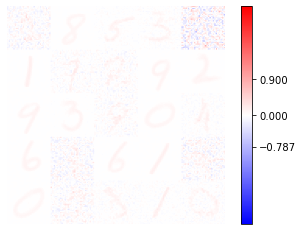

Normalizations:  5.65243  +-  23.075315


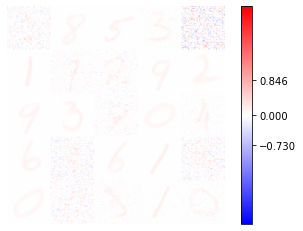

Adjusting learning rate of group 0 to 1.6400e-02.
Normalizations:  5.277149  +-  22.15718


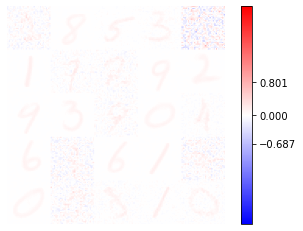

Normalizations:  4.953053  +-  21.505724


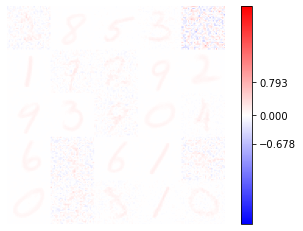

Adjusting learning rate of group 0 to 1.6300e-02.
Normalizations:  4.6296935  +-  20.418375


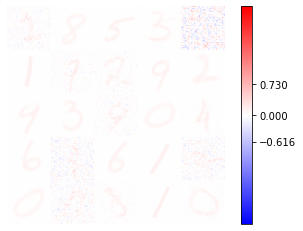

Normalizations:  4.337455  +-  19.552725


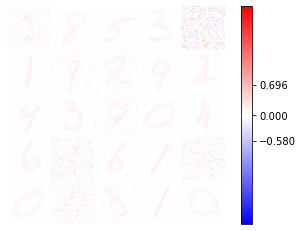

Adjusting learning rate of group 0 to 1.6200e-02.
Normalizations:  4.0960283  +-  18.79327


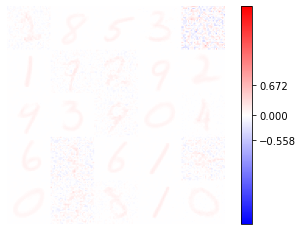

Normalizations:  3.8752387  +-  18.165384


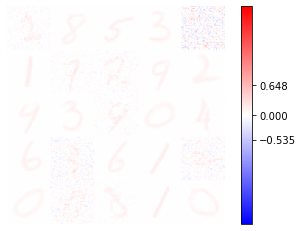

Adjusting learning rate of group 0 to 1.6100e-02.
Normalizations:  3.6678874  +-  17.51386


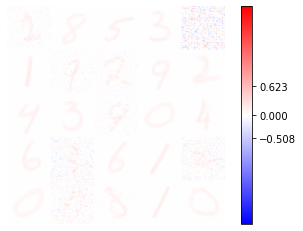

Normalizations:  3.473667  +-  16.697233


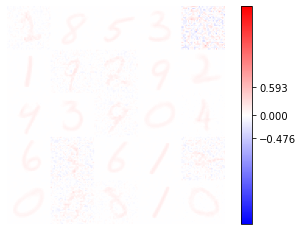

Adjusting learning rate of group 0 to 1.6000e-02.
Normalizations:  3.3124516  +-  16.308893


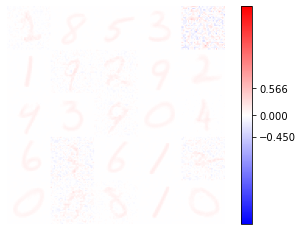

Normalizations:  3.1642969  +-  15.664838


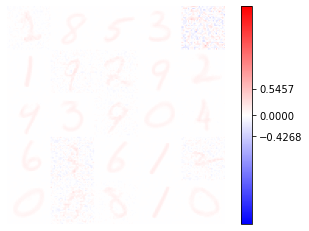

Adjusting learning rate of group 0 to 1.5900e-02.
Normalizations:  3.0331635  +-  15.336334


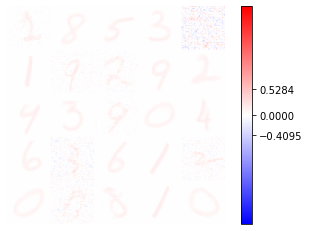

Normalizations:  2.9111798  +-  15.02277


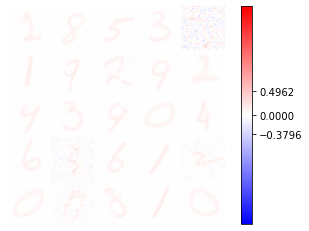

Adjusting learning rate of group 0 to 1.5800e-02.
Normalizations:  2.7934732  +-  14.3959465


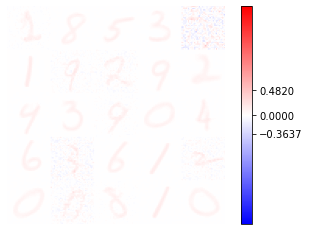

Normalizations:  2.6907692  +-  14.053129


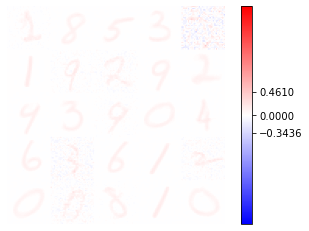

Adjusting learning rate of group 0 to 1.5700e-02.
Normalizations:  2.5887601  +-  13.468017


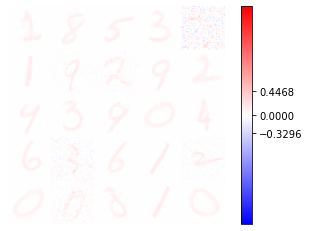

Normalizations:  2.496493  +-  12.92581


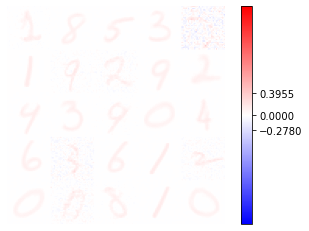

Adjusting learning rate of group 0 to 1.5600e-02.
Normalizations:  2.41444  +-  12.526598


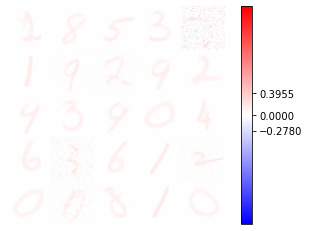

Normalizations:  2.3491068  +-  12.263845


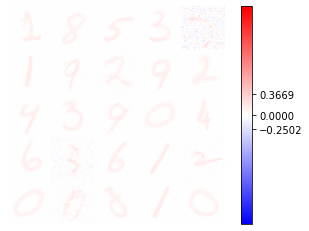

Adjusting learning rate of group 0 to 1.5500e-02.
Normalizations:  2.2831006  +-  11.89094


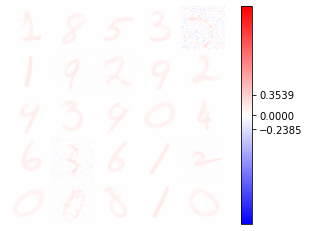

Normalizations:  2.2302215  +-  11.652332


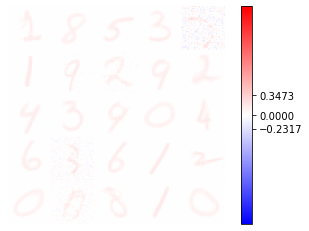

Adjusting learning rate of group 0 to 1.5400e-02.
Normalizations:  2.1582649  +-  11.225523


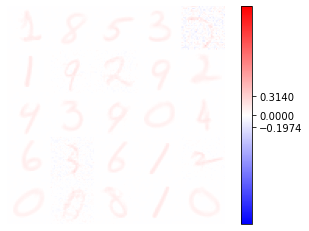

Normalizations:  2.1021335  +-  10.924578


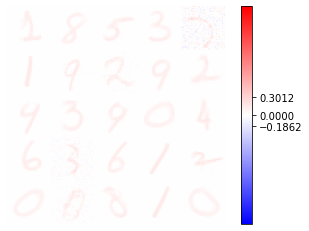

Adjusting learning rate of group 0 to 1.5300e-02.
Normalizations:  2.0627244  +-  10.767573


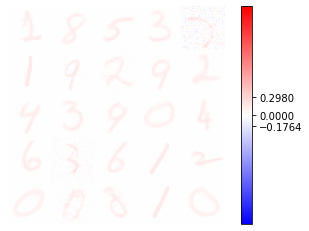

Normalizations:  2.0154338  +-  10.455829


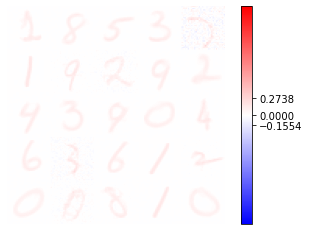

Adjusting learning rate of group 0 to 1.5200e-02.
Normalizations:  1.9682103  +-  10.186333


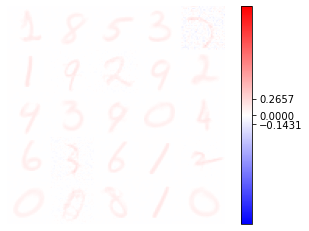

Normalizations:  1.9260626  +-  9.908504


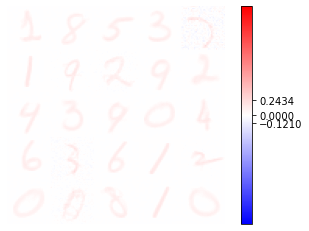

Adjusting learning rate of group 0 to 1.5100e-02.
Normalizations:  1.8902373  +-  9.701928


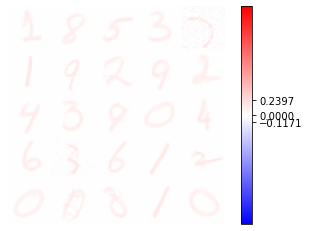

Normalizations:  1.8519331  +-  9.456571


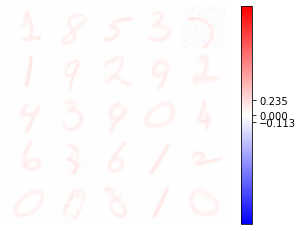

Adjusting learning rate of group 0 to 1.5000e-02.
Normalizations:  1.8229167  +-  9.289954


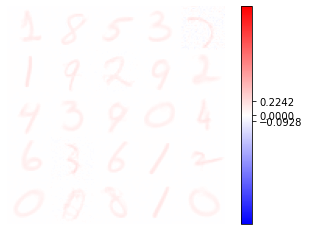

Normalizations:  1.7876381  +-  8.977419


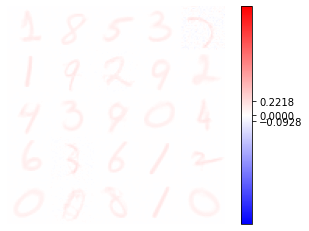

Adjusting learning rate of group 0 to 1.4900e-02.
Normalizations:  1.7636707  +-  8.907371


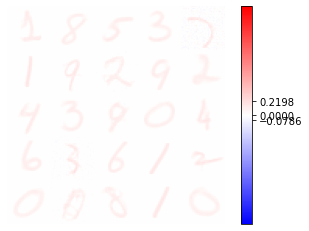

Normalizations:  1.7341285  +-  8.675405


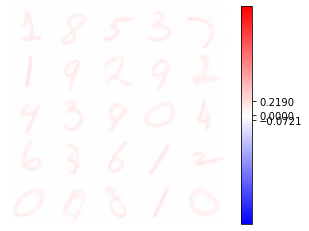

Adjusting learning rate of group 0 to 1.4800e-02.
Normalizations:  1.7136108  +-  8.575294


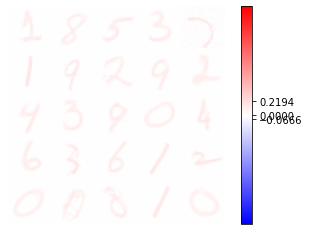

Normalizations:  1.6934334  +-  8.458131


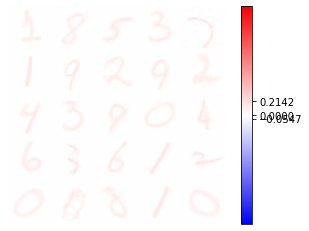

Adjusting learning rate of group 0 to 1.4700e-02.
Normalizations:  1.6702579  +-  8.269545


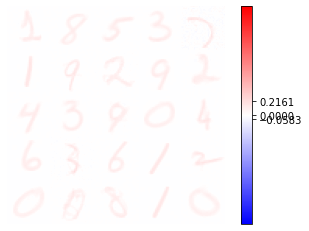

Normalizations:  1.6489787  +-  8.101485


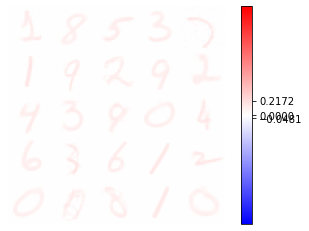

Adjusting learning rate of group 0 to 1.4600e-02.
Normalizations:  1.6278073  +-  7.987589


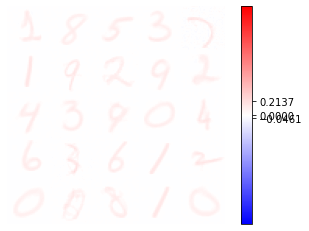

Normalizations:  1.613054  +-  7.9051585


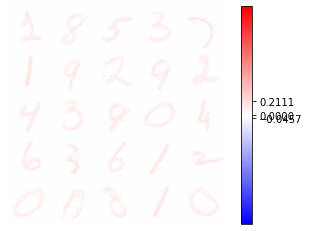

Adjusting learning rate of group 0 to 1.4500e-02.
Normalizations:  1.5839962  +-  7.59053


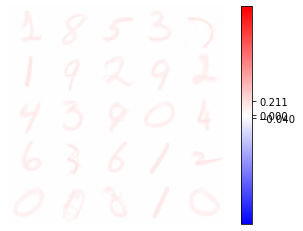

Normalizations:  1.5676123  +-  7.4992104


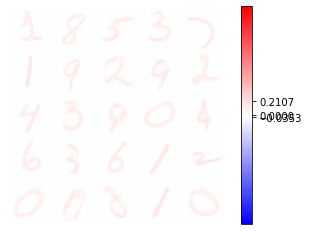

Adjusting learning rate of group 0 to 1.4400e-02.
Normalizations:  1.5458803  +-  7.237213


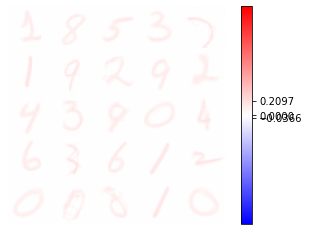

Normalizations:  1.52679  +-  7.026437


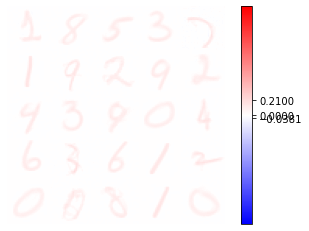

Adjusting learning rate of group 0 to 1.4300e-02.
Normalizations:  1.5105318  +-  6.892655


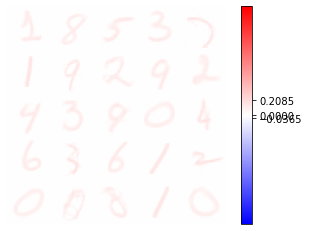

Normalizations:  1.4970156  +-  6.728884


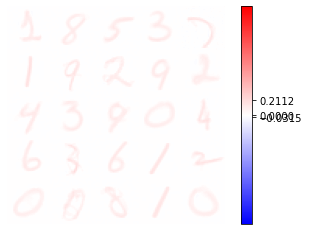

Adjusting learning rate of group 0 to 1.4200e-02.
Normalizations:  1.4770826  +-  6.534967


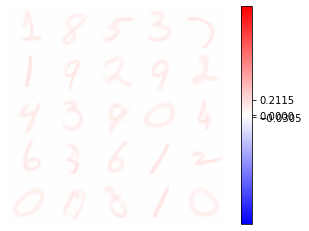

Normalizations:  1.4583135  +-  6.295617


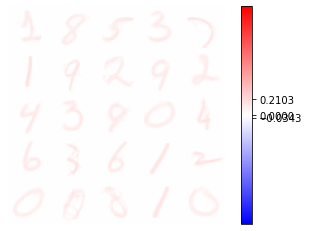

Adjusting learning rate of group 0 to 1.4100e-02.
Normalizations:  1.4450994  +-  6.1951375


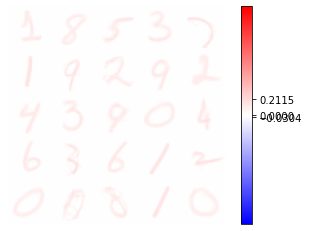

Normalizations:  1.4347111  +-  6.084831


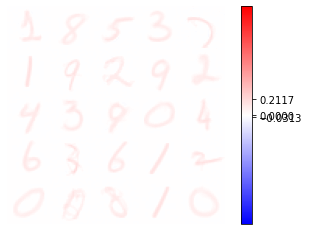

Adjusting learning rate of group 0 to 1.4000e-02.
Normalizations:  1.4159578  +-  5.8650723


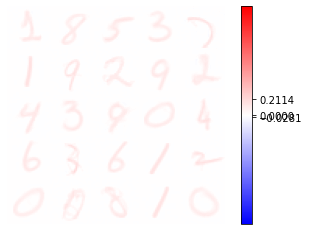

Normalizations:  1.4023343  +-  5.7277083


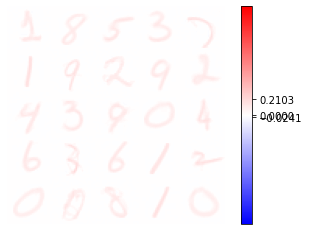

Adjusting learning rate of group 0 to 1.3900e-02.
Normalizations:  1.3890887  +-  5.5497437


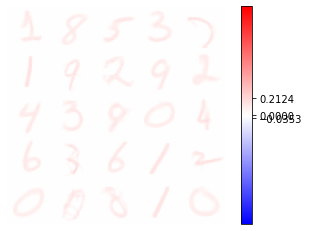

Normalizations:  1.375366  +-  5.383719


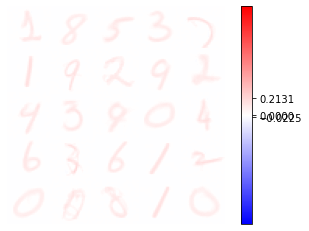

Adjusting learning rate of group 0 to 1.3800e-02.
Normalizations:  1.3637798  +-  5.235834


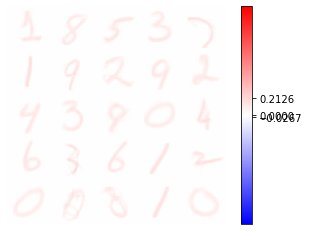

Normalizations:  1.3522485  +-  5.0884523


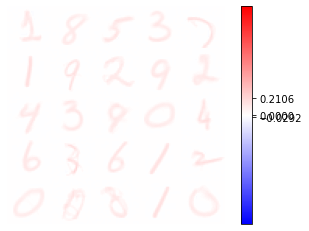

Adjusting learning rate of group 0 to 1.3700e-02.
Normalizations:  1.3433657  +-  4.9984665


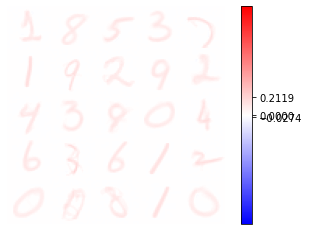

Normalizations:  1.3325044  +-  4.846495


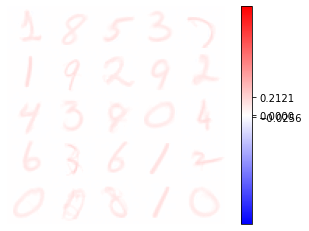

Adjusting learning rate of group 0 to 1.3600e-02.
Normalizations:  1.3215818  +-  4.7177253


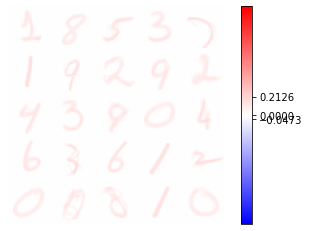

Normalizations:  1.3099495  +-  4.542438


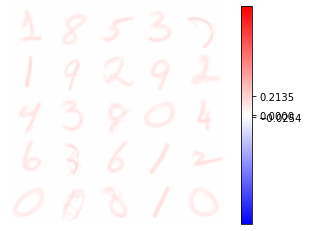

Adjusting learning rate of group 0 to 1.3500e-02.
Normalizations:  1.3013209  +-  4.453448


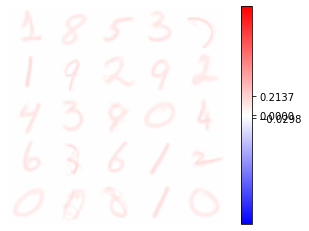

Normalizations:  1.2923838  +-  4.3566694


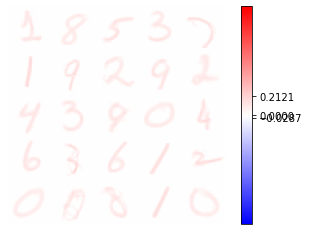

Adjusting learning rate of group 0 to 1.3400e-02.
Normalizations:  1.2814014  +-  4.1946454


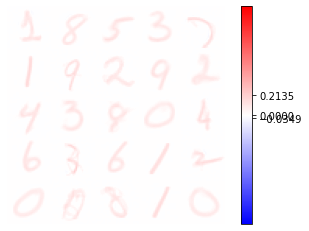

Normalizations:  1.270451  +-  4.056902


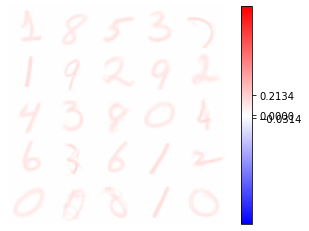

Adjusting learning rate of group 0 to 1.3300e-02.
Normalizations:  1.2646418  +-  3.992422


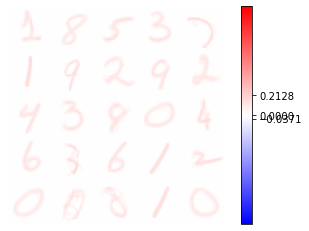

Normalizations:  1.2624528  +-  3.9504733


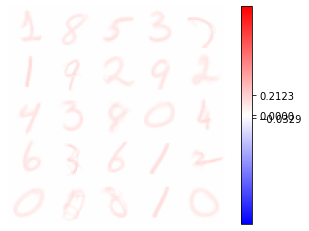

Adjusting learning rate of group 0 to 1.3200e-02.
Normalizations:  1.2508842  +-  3.8133502


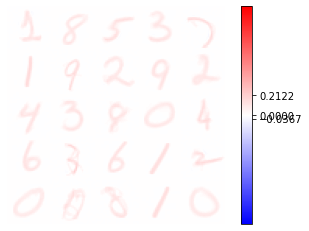

Normalizations:  1.2423772  +-  3.7073298


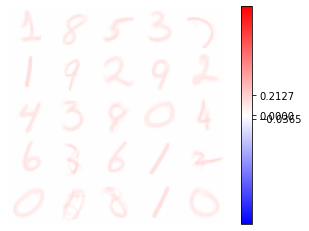

Adjusting learning rate of group 0 to 1.3100e-02.
Normalizations:  1.2367097  +-  3.6364858


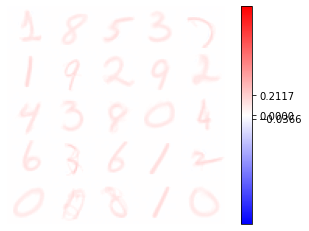

Normalizations:  1.2290281  +-  3.5205388


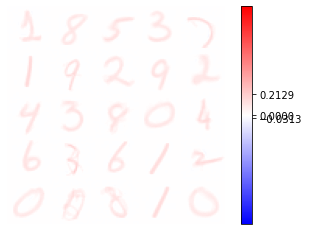

Adjusting learning rate of group 0 to 1.3000e-02.
Normalizations:  1.2245132  +-  3.4703386


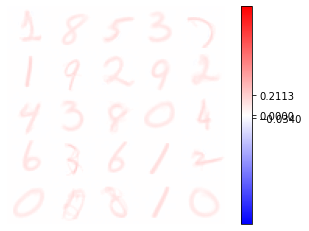

Normalizations:  1.2175794  +-  3.3801703


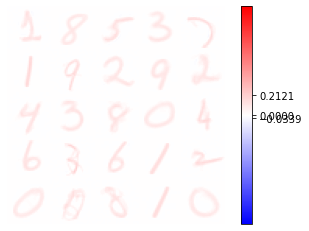

Adjusting learning rate of group 0 to 1.2900e-02.
Normalizations:  1.2118227  +-  3.3097243


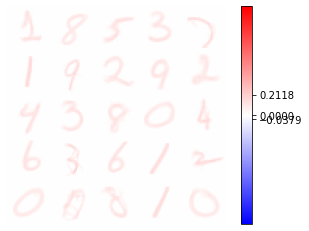

Normalizations:  1.2083321  +-  3.281509


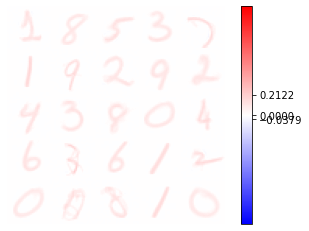

Adjusting learning rate of group 0 to 1.2800e-02.
Normalizations:  1.2005384  +-  3.1578524


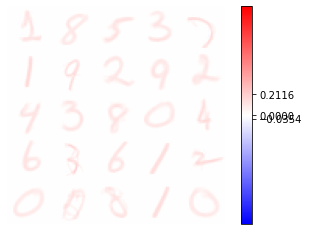

Normalizations:  1.195221  +-  3.1082249


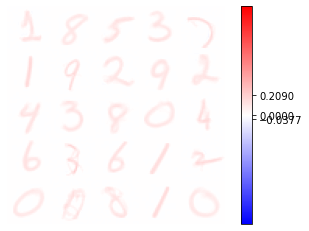

Adjusting learning rate of group 0 to 1.2700e-02.
Normalizations:  1.1896203  +-  3.01229


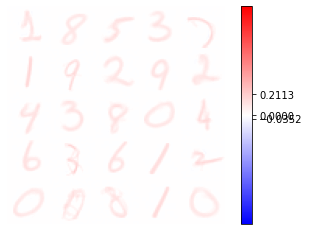

Normalizations:  1.1852722  +-  2.9388292


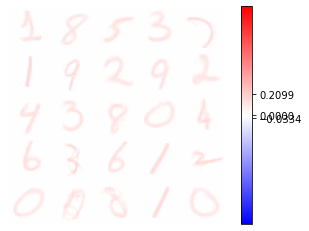

Adjusting learning rate of group 0 to 1.2600e-02.
Normalizations:  1.1782182  +-  2.8502448


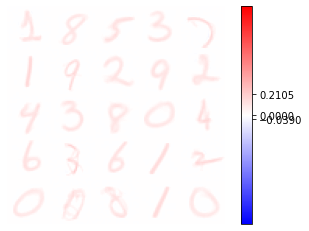

Normalizations:  1.1741294  +-  2.787897


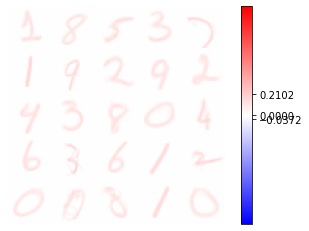

Adjusting learning rate of group 0 to 1.2500e-02.
Normalizations:  1.1683581  +-  2.6977262


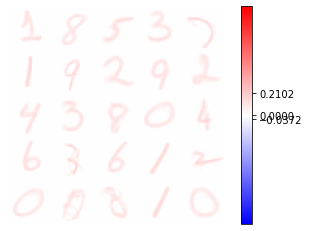

Normalizations:  1.1624339  +-  2.619514


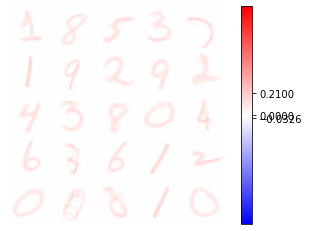

Adjusting learning rate of group 0 to 1.2400e-02.
Normalizations:  1.1580768  +-  2.548101


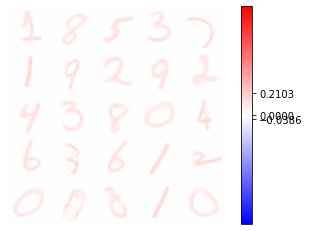

Normalizations:  1.1517415  +-  2.4471714


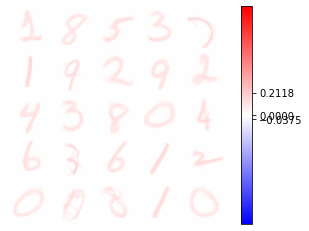

Adjusting learning rate of group 0 to 1.2300e-02.
Normalizations:  1.1486943  +-  2.4071124


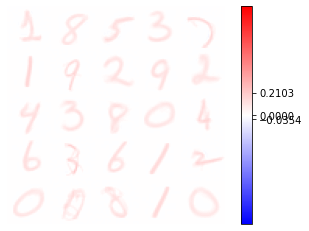

Normalizations:  1.144997  +-  2.3588939


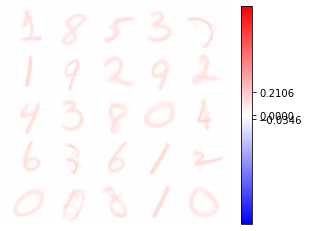

Adjusting learning rate of group 0 to 1.2200e-02.
Normalizations:  1.1395612  +-  2.2704096


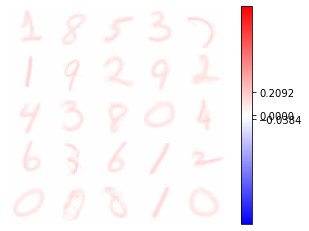

Normalizations:  1.1358691  +-  2.224379


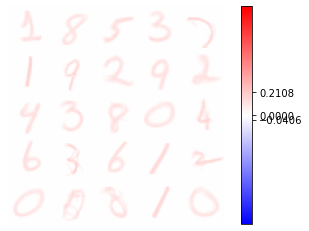

Adjusting learning rate of group 0 to 1.2100e-02.
Normalizations:  1.1317376  +-  2.1429288


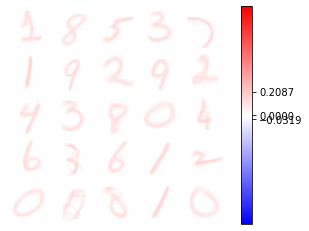

Normalizations:  1.128135  +-  2.1129875


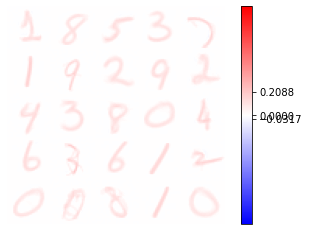

Adjusting learning rate of group 0 to 1.2000e-02.
Normalizations:  1.1236316  +-  2.0195067


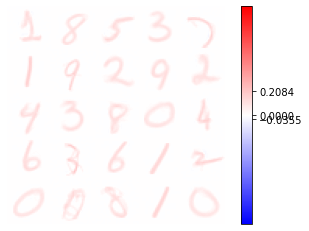

Normalizations:  1.1188931  +-  1.9484267


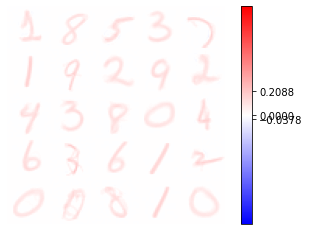

Adjusting learning rate of group 0 to 1.1900e-02.
Normalizations:  1.1163996  +-  1.9001385


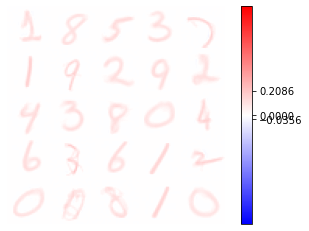

Normalizations:  1.1145453  +-  1.8850106


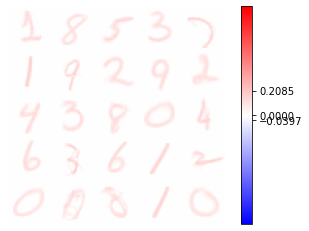

Adjusting learning rate of group 0 to 1.1800e-02.
Normalizations:  1.1096997  +-  1.7862709


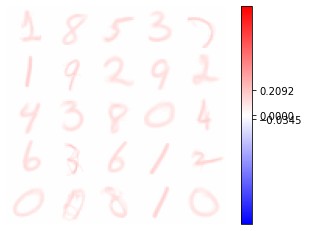

Normalizations:  1.1052097  +-  1.7029655


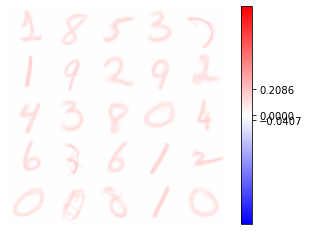

Adjusting learning rate of group 0 to 1.1700e-02.
Normalizations:  1.1033812  +-  1.678569


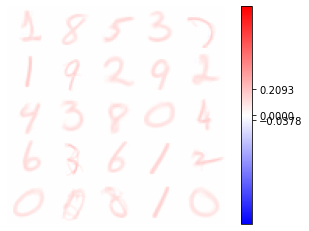

Normalizations:  1.1000383  +-  1.6345042


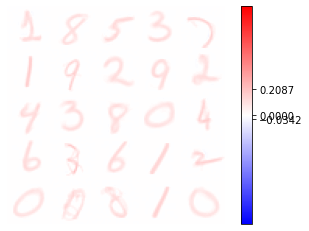

Adjusting learning rate of group 0 to 1.1600e-02.
Normalizations:  1.0974221  +-  1.5762125


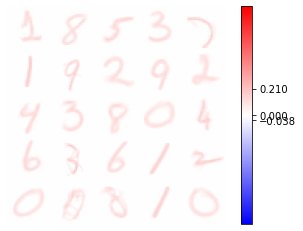

Normalizations:  1.0924666  +-  1.4938703


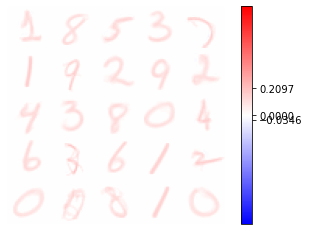

Adjusting learning rate of group 0 to 1.1500e-02.
Normalizations:  1.0917718  +-  1.4780464


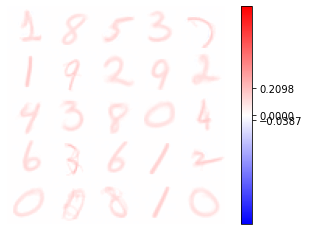

Normalizations:  1.0875579  +-  1.4023004


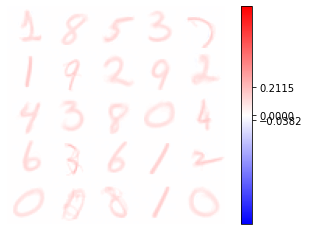

Adjusting learning rate of group 0 to 1.1400e-02.
Normalizations:  1.0864327  +-  1.3825935


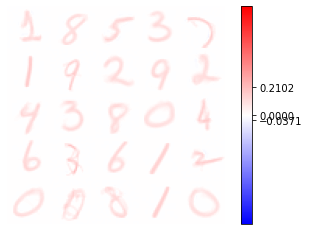

Normalizations:  1.0839568  +-  1.3378549


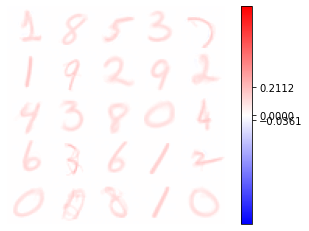

Adjusting learning rate of group 0 to 1.1300e-02.
Normalizations:  1.0818435  +-  1.2951938


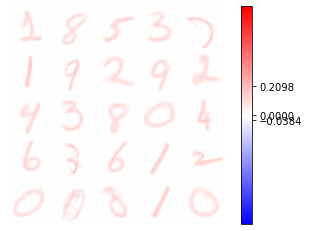

Normalizations:  1.0783691  +-  1.2344995


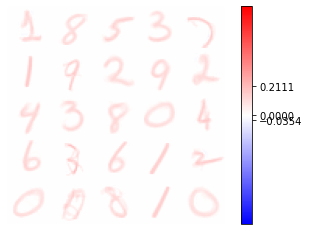

Adjusting learning rate of group 0 to 1.1200e-02.
Normalizations:  1.0769895  +-  1.2080325


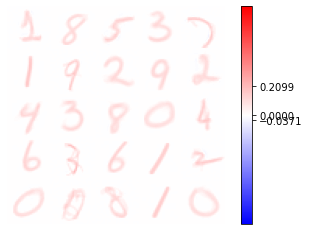

Normalizations:  1.0752616  +-  1.1802478


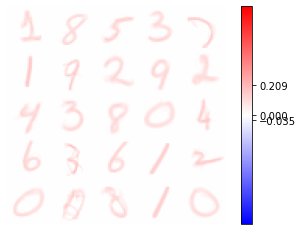

Adjusting learning rate of group 0 to 1.1100e-02.
Normalizations:  1.0727283  +-  1.1267989


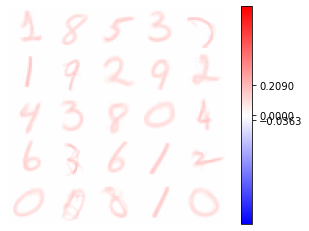

Normalizations:  1.0706265  +-  1.0821482


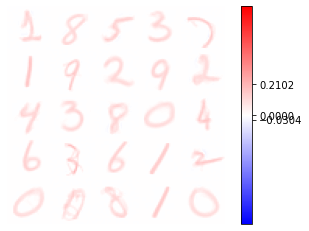

Adjusting learning rate of group 0 to 1.1000e-02.
Normalizations:  1.0688565  +-  1.0527501


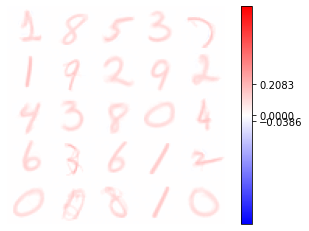

Normalizations:  1.0669566  +-  1.0195644


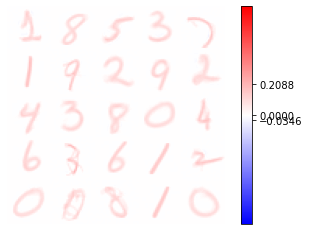

Adjusting learning rate of group 0 to 1.0900e-02.
Normalizations:  1.065018  +-  0.9805424


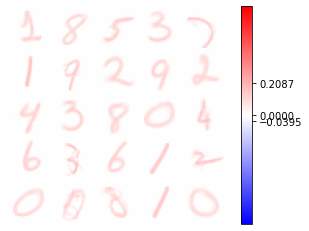

Normalizations:  1.0630559  +-  0.9434912


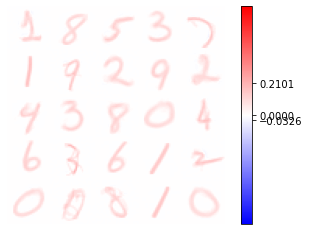

Adjusting learning rate of group 0 to 1.0800e-02.
Normalizations:  1.0616167  +-  0.9127199


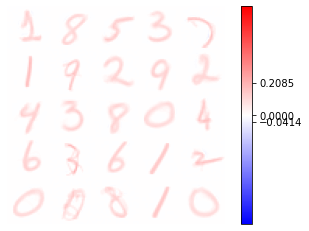

Normalizations:  1.0593725  +-  0.8741665


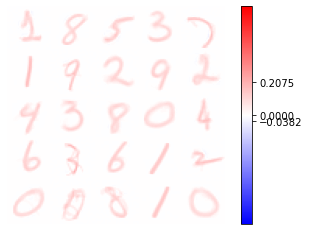

Adjusting learning rate of group 0 to 1.0700e-02.
Normalizations:  1.058102  +-  0.844243


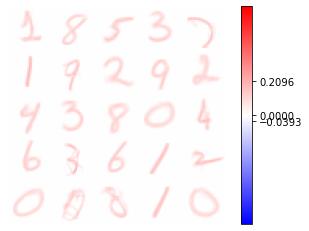

Normalizations:  1.0553749  +-  0.7930113


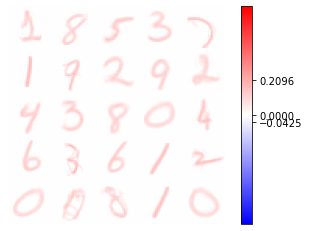

Adjusting learning rate of group 0 to 1.0600e-02.
Normalizations:  1.0550716  +-  0.78325444


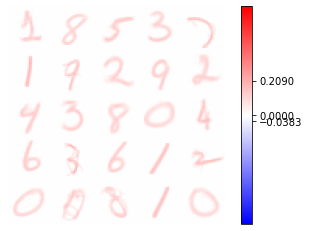

Normalizations:  1.0540906  +-  0.7687044


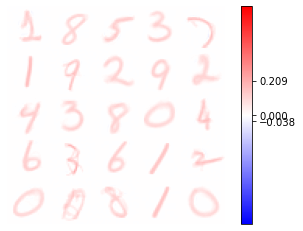

Adjusting learning rate of group 0 to 1.0500e-02.
Normalizations:  1.0519756  +-  0.7232204


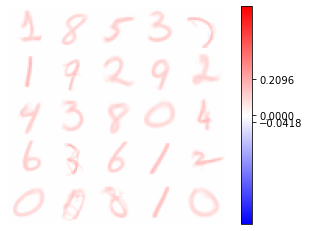

Normalizations:  1.0502365  +-  0.69500196


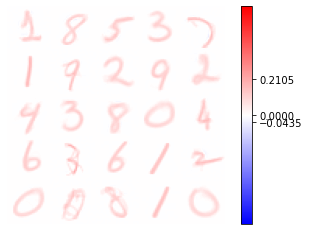

Adjusting learning rate of group 0 to 1.0400e-02.
Normalizations:  1.0487044  +-  0.6645719


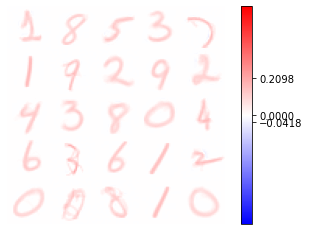

Normalizations:  1.0473293  +-  0.637758


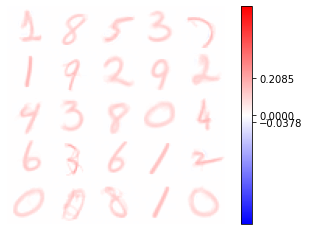

Adjusting learning rate of group 0 to 1.0300e-02.
Normalizations:  1.046156  +-  0.6124026


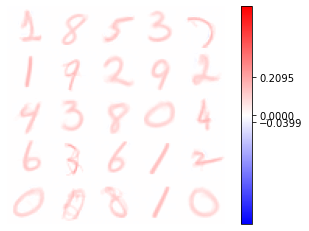

Normalizations:  1.0449437  +-  0.59101534


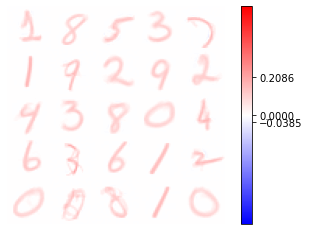

Adjusting learning rate of group 0 to 1.0200e-02.
Normalizations:  1.0435665  +-  0.56314707


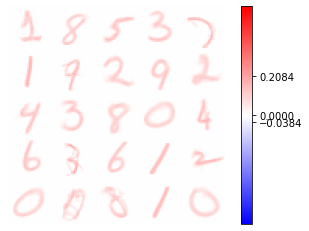

Normalizations:  1.0421898  +-  0.53412026


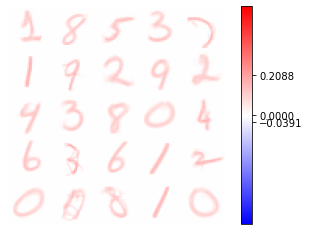

Adjusting learning rate of group 0 to 1.0100e-02.
Normalizations:  1.0410596  +-  0.5149801


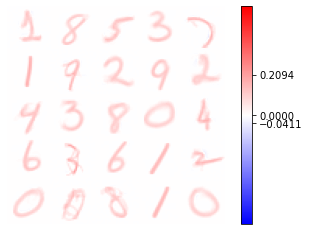

Normalizations:  1.0402547  +-  0.5014113


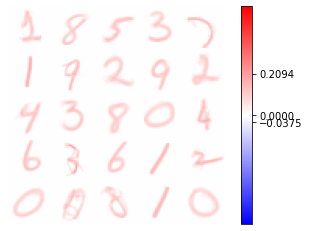

Adjusting learning rate of group 0 to 1.0000e-02.
Normalizations:  1.0391829  +-  0.4780185


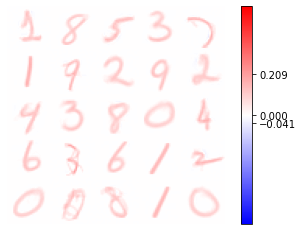

Normalizations:  1.0377991  +-  0.45289707


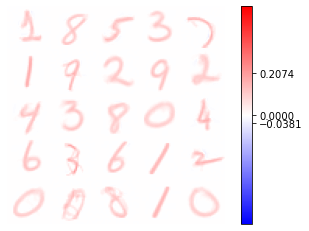

Adjusting learning rate of group 0 to 9.9000e-03.
Normalizations:  1.0368515  +-  0.43658584


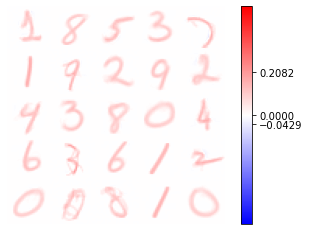

Normalizations:  1.0358123  +-  0.418027


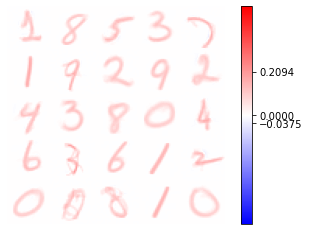

Adjusting learning rate of group 0 to 9.8000e-03.
Normalizations:  1.0350145  +-  0.39711562


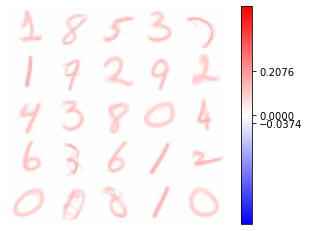

Normalizations:  1.0342002  +-  0.38517064


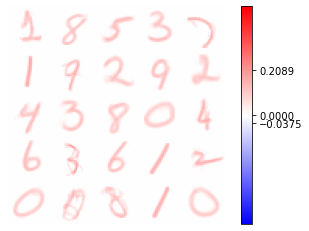

Adjusting learning rate of group 0 to 9.7000e-03.
Normalizations:  1.0331725  +-  0.36341187


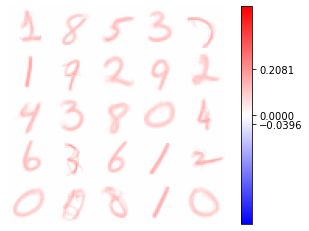

Normalizations:  1.0319124  +-  0.3441387


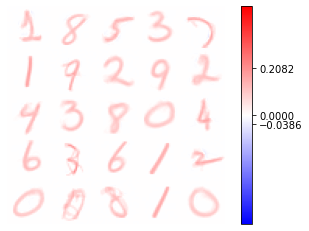

Adjusting learning rate of group 0 to 9.6000e-03.
Normalizations:  1.0311582  +-  0.32884553


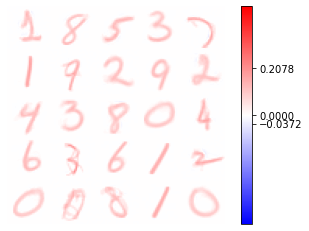

Normalizations:  1.0301018  +-  0.3080818


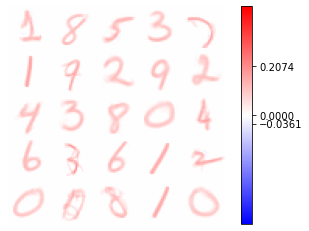

Adjusting learning rate of group 0 to 9.5000e-03.
Normalizations:  1.0296153  +-  0.3030878


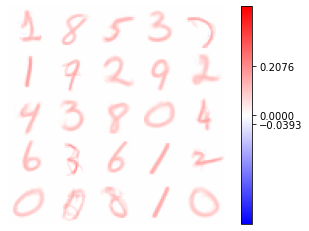

Normalizations:  1.0290536  +-  0.29228765


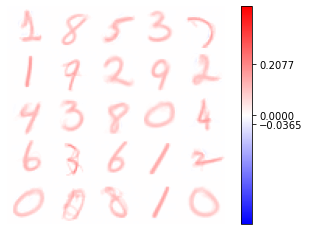

Adjusting learning rate of group 0 to 9.4000e-03.
Normalizations:  1.0282925  +-  0.27765554


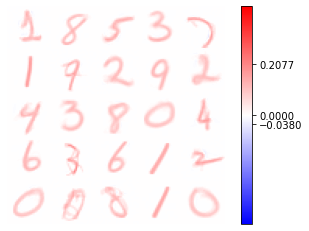

Normalizations:  1.0274619  +-  0.263693


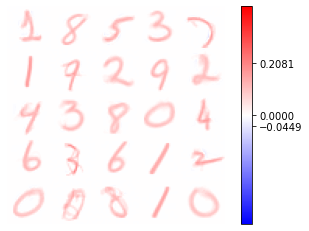

Adjusting learning rate of group 0 to 9.3000e-03.
Normalizations:  1.0266337  +-  0.25292042


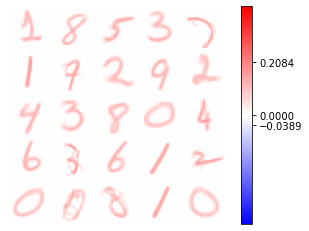

Normalizations:  1.0258489  +-  0.23903967


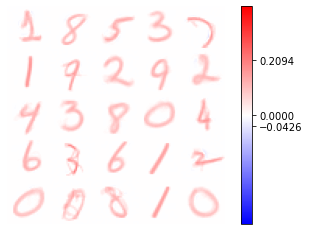

Adjusting learning rate of group 0 to 9.2000e-03.
Normalizations:  1.0255437  +-  0.23329194


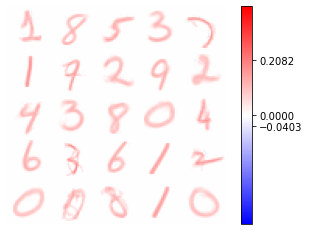

Normalizations:  1.0248404  +-  0.22393893


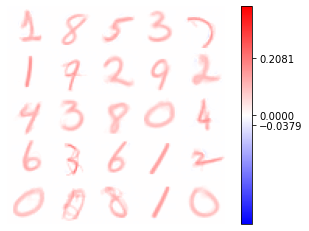

Adjusting learning rate of group 0 to 9.1000e-03.
Normalizations:  1.0244473  +-  0.21455601


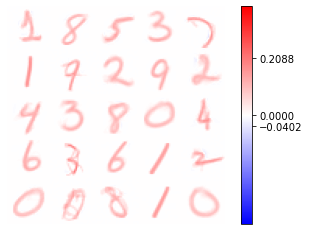

Normalizations:  1.0236683  +-  0.20325418


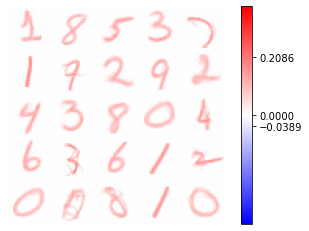

Adjusting learning rate of group 0 to 9.0000e-03.
Normalizations:  1.0231794  +-  0.19762744


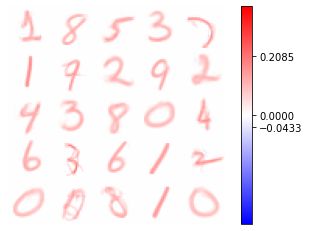

Normalizations:  1.0226722  +-  0.18741235


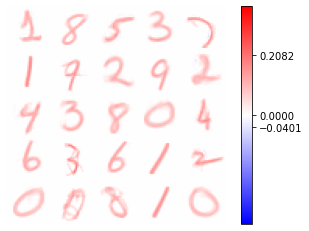

Adjusting learning rate of group 0 to 8.9000e-03.
Normalizations:  1.0220866  +-  0.17980908


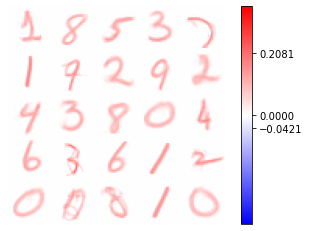

Normalizations:  1.0216975  +-  0.1772469


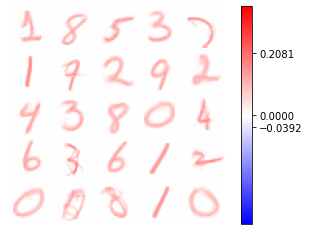

Adjusting learning rate of group 0 to 8.8000e-03.
Normalizations:  1.0212351  +-  0.16940631


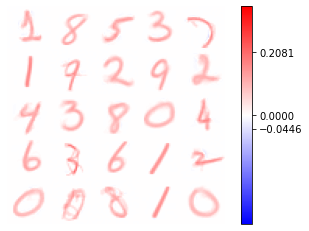

Normalizations:  1.0210779  +-  0.16877678


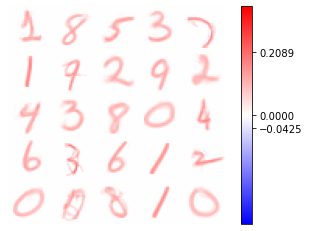

Adjusting learning rate of group 0 to 8.7000e-03.
Normalizations:  1.0205117  +-  0.15797426


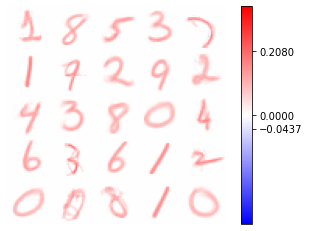

Normalizations:  1.0203424  +-  0.15712301


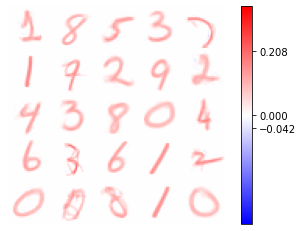

Adjusting learning rate of group 0 to 8.6000e-03.
Normalizations:  1.0198984  +-  0.15171218


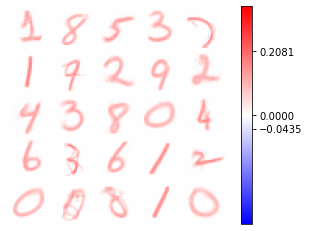

Normalizations:  1.0194203  +-  0.14521372


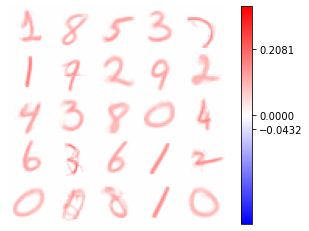

Adjusting learning rate of group 0 to 8.5000e-03.
Normalizations:  1.0191438  +-  0.1406412


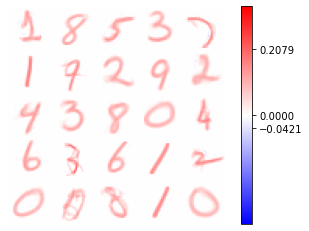

Normalizations:  1.018881  +-  0.13820884


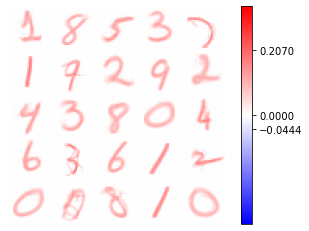

Adjusting learning rate of group 0 to 8.4000e-03.
Normalizations:  1.0184597  +-  0.13093242


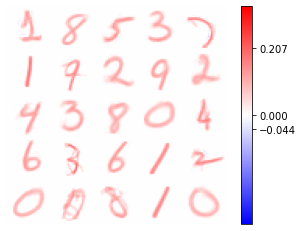

Normalizations:  1.018436  +-  0.13406654


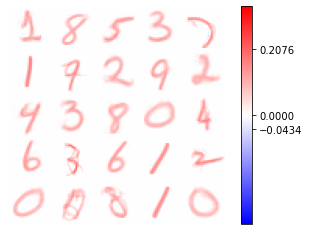

Adjusting learning rate of group 0 to 8.3000e-03.
Normalizations:  1.0178964  +-  0.12608539


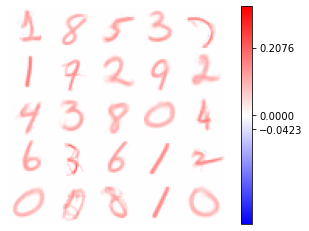

Normalizations:  1.0176319  +-  0.12087572


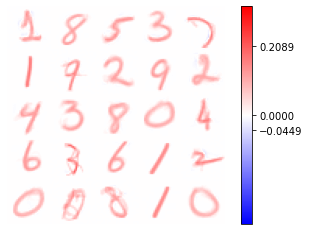

Adjusting learning rate of group 0 to 8.2000e-03.
Normalizations:  1.0173247  +-  0.118699856


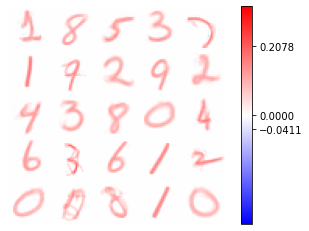

Normalizations:  1.0170144  +-  0.114547685


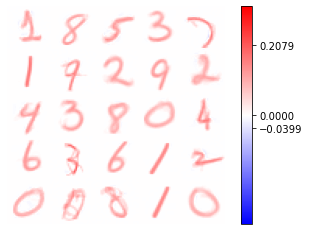

Adjusting learning rate of group 0 to 8.1000e-03.
Normalizations:  1.0168498  +-  0.112538114


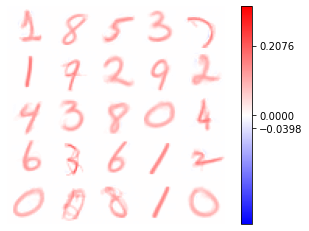

Normalizations:  1.0165004  +-  0.11081595


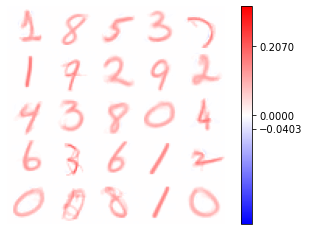

Adjusting learning rate of group 0 to 8.0000e-03.
Normalizations:  1.0161266  +-  0.10502432


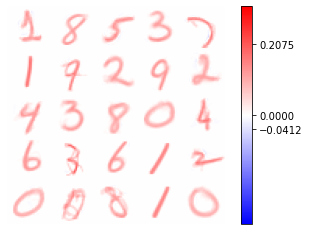

Normalizations:  1.0161242  +-  0.10616439


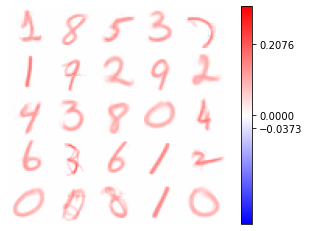

Adjusting learning rate of group 0 to 7.9000e-03.
Normalizations:  1.0158132  +-  0.09970201


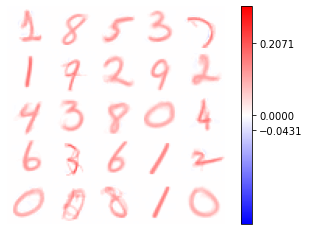

Normalizations:  1.0156219  +-  0.09580212


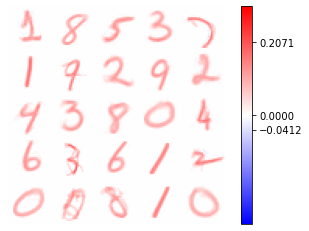

Adjusting learning rate of group 0 to 7.8000e-03.
Normalizations:  1.0155034  +-  0.09560928


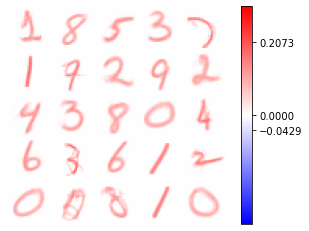

Normalizations:  1.0153341  +-  0.097303145


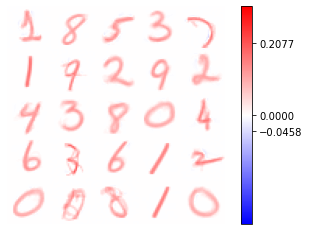

Adjusting learning rate of group 0 to 7.7000e-03.
Normalizations:  1.0150592  +-  0.0929493


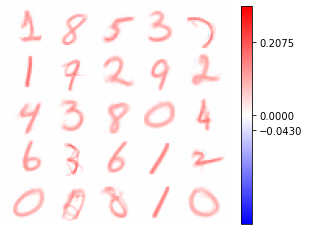

Normalizations:  1.0149041  +-  0.09216315


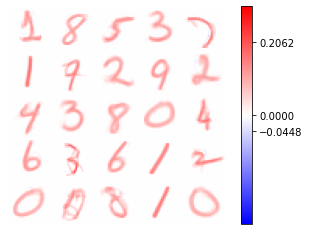

Adjusting learning rate of group 0 to 7.6000e-03.
Normalizations:  1.0147046  +-  0.087246165


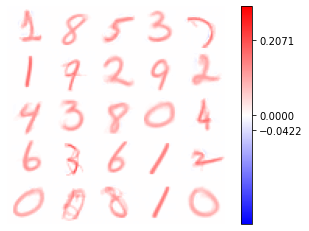

Normalizations:  1.0145851  +-  0.086865485


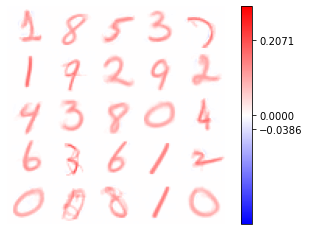

Adjusting learning rate of group 0 to 7.5000e-03.
Normalizations:  1.0145241  +-  0.08373154


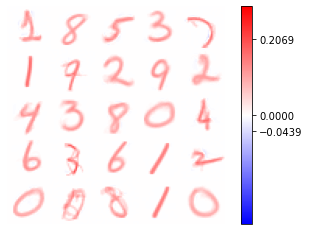

Normalizations:  1.014382  +-  0.08146703


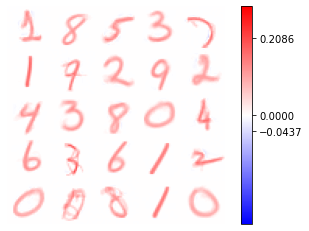

Adjusting learning rate of group 0 to 7.4000e-03.
Normalizations:  1.0142293  +-  0.082457066


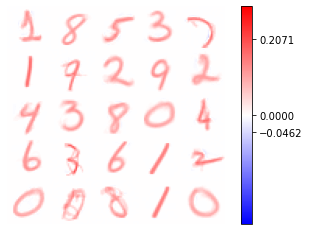

Normalizations:  1.0140488  +-  0.08226499


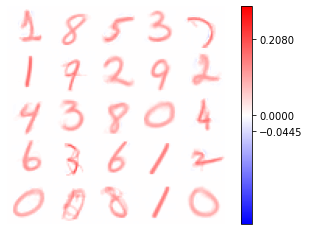

Adjusting learning rate of group 0 to 7.3000e-03.
Normalizations:  1.0138413  +-  0.07841776


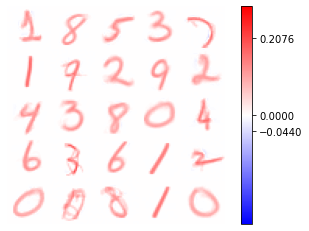

Normalizations:  1.0135773  +-  0.07362787


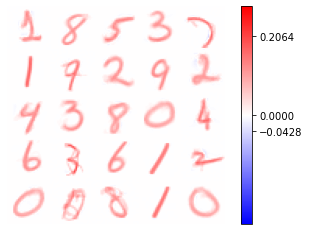

Adjusting learning rate of group 0 to 7.2000e-03.
Normalizations:  1.0135648  +-  0.07464191


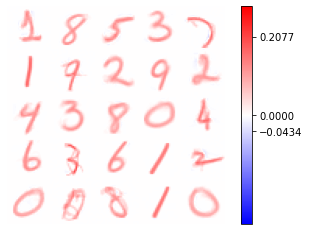

Normalizations:  1.0135437  +-  0.07564069


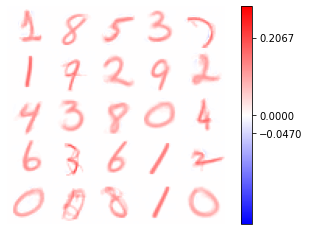

Adjusting learning rate of group 0 to 7.1000e-03.
Normalizations:  1.0132926  +-  0.07258263


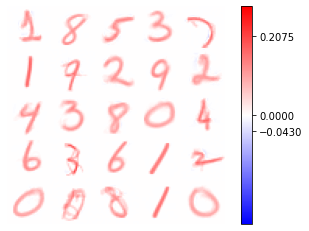

Normalizations:  1.0130854  +-  0.06987028


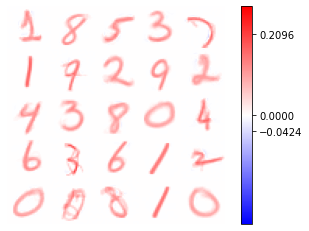

Adjusting learning rate of group 0 to 7.0000e-03.
Normalizations:  1.013124  +-  0.06976598


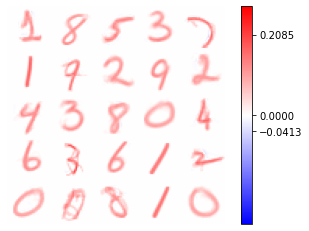

Normalizations:  1.0128747  +-  0.066799894


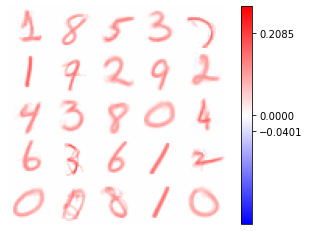

Adjusting learning rate of group 0 to 6.9000e-03.
Normalizations:  1.0127406  +-  0.06653194


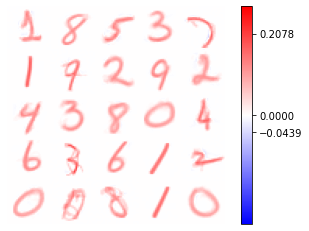

Normalizations:  1.0125118  +-  0.06410186


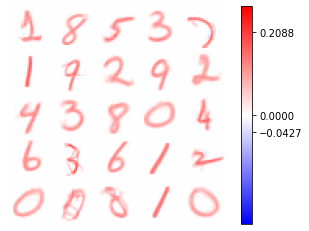

Adjusting learning rate of group 0 to 6.8000e-03.
Normalizations:  1.0124544  +-  0.06408415


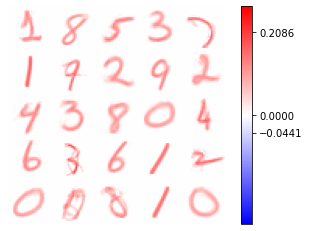

Normalizations:  1.012311  +-  0.06474847


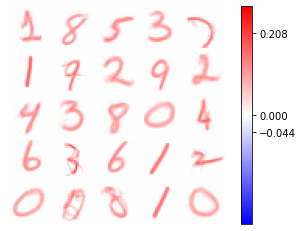

Adjusting learning rate of group 0 to 6.7000e-03.
Normalizations:  1.0122353  +-  0.061303165


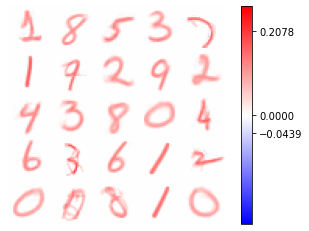

Normalizations:  1.0120918  +-  0.05897367


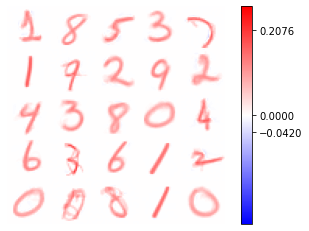

Adjusting learning rate of group 0 to 6.6000e-03.
Normalizations:  1.0119108  +-  0.058823794


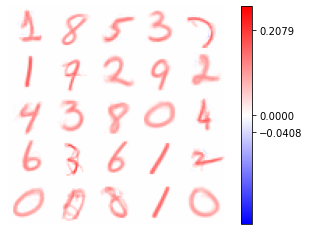

Normalizations:  1.0117655  +-  0.055935003


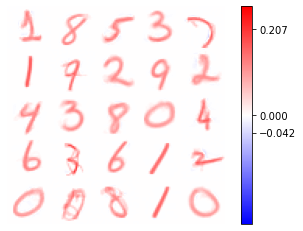

Adjusting learning rate of group 0 to 6.5000e-03.
Normalizations:  1.0117394  +-  0.055835545


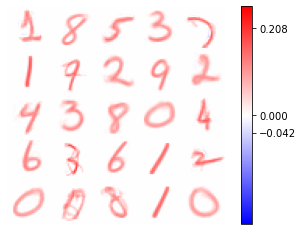

Normalizations:  1.0115625  +-  0.055113744


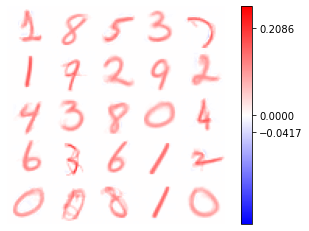

Adjusting learning rate of group 0 to 6.4000e-03.
Normalizations:  1.0114429  +-  0.055065792


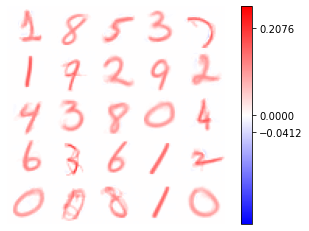

Normalizations:  1.0113341  +-  0.05306479


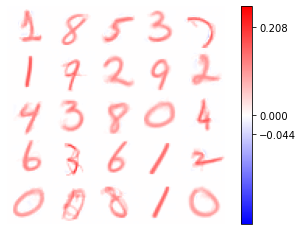

Adjusting learning rate of group 0 to 6.3000e-03.
Normalizations:  1.0112789  +-  0.05390948


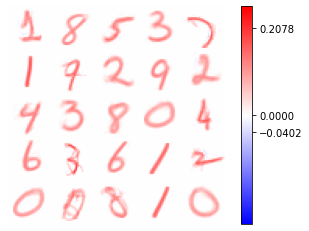

Normalizations:  1.0110912  +-  0.051457677


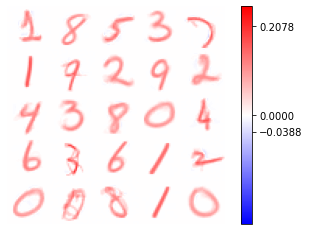

Adjusting learning rate of group 0 to 6.2000e-03.
Normalizations:  1.0109955  +-  0.05207304


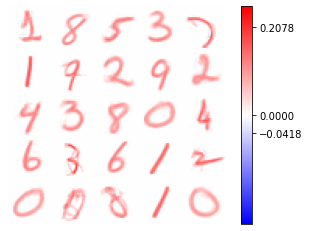

Normalizations:  1.0109289  +-  0.052026816


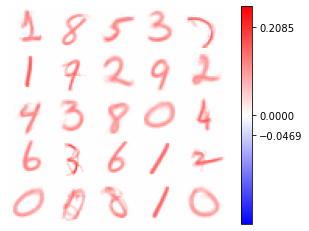

Adjusting learning rate of group 0 to 6.1000e-03.
Normalizations:  1.0107716  +-  0.049031265


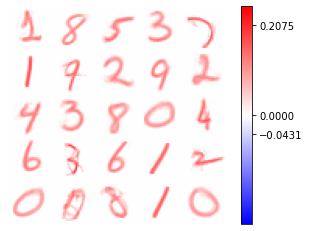

Normalizations:  1.0107428  +-  0.04901858


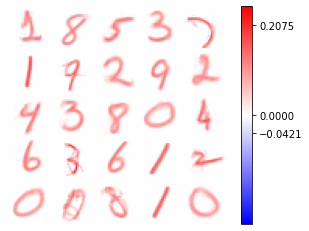

Adjusting learning rate of group 0 to 6.0000e-03.
Normalizations:  1.0105712  +-  0.04699389


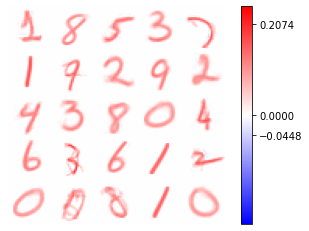

Normalizations:  1.0104614  +-  0.045483127


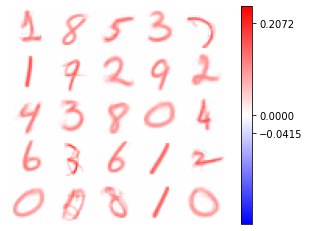

Adjusting learning rate of group 0 to 5.9000e-03.
Normalizations:  1.010394  +-  0.046051968


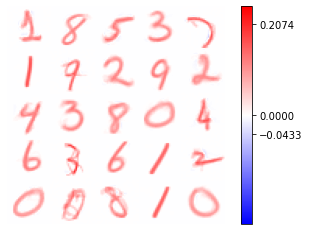

Normalizations:  1.0102961  +-  0.043980792


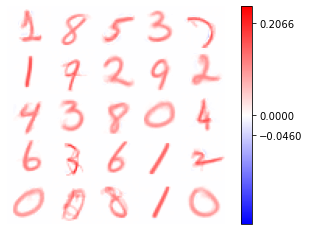

Adjusting learning rate of group 0 to 5.8000e-03.
Normalizations:  1.010301  +-  0.044389267


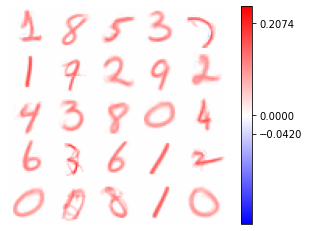

Normalizations:  1.0102147  +-  0.045141473


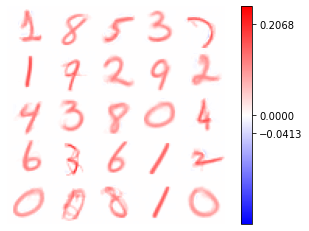

Adjusting learning rate of group 0 to 5.7000e-03.
Normalizations:  1.0100839  +-  0.043733668


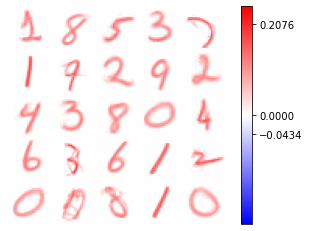

Normalizations:  1.0099859  +-  0.04371127


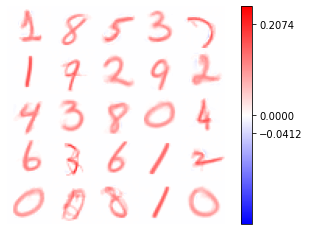

Adjusting learning rate of group 0 to 5.6000e-03.
Normalizations:  1.0098155  +-  0.041765172


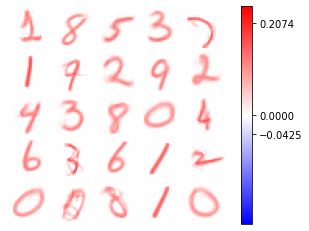

Normalizations:  1.0097662  +-  0.0410964


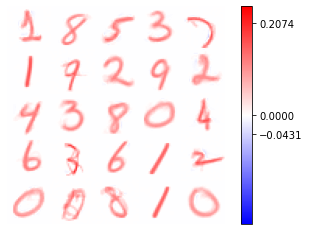

Adjusting learning rate of group 0 to 5.5000e-03.
Normalizations:  1.0096643  +-  0.041036908


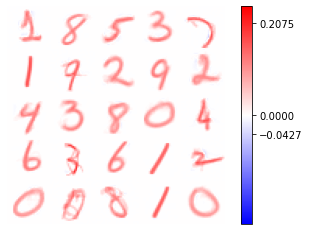

Normalizations:  1.0095656  +-  0.041006584


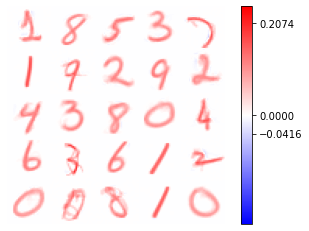

Adjusting learning rate of group 0 to 5.4000e-03.
Normalizations:  1.0094671  +-  0.039704975


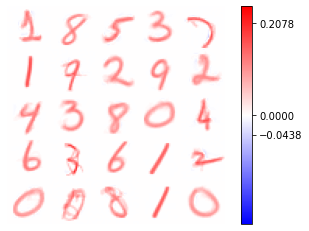

Normalizations:  1.0093974  +-  0.03969482


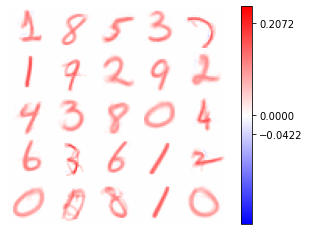

Adjusting learning rate of group 0 to 5.3000e-03.
Normalizations:  1.0093017  +-  0.038273092


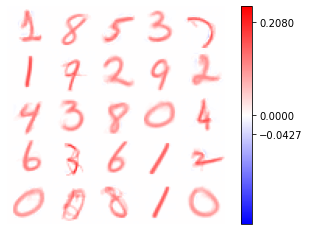

Normalizations:  1.0091816  +-  0.03862662


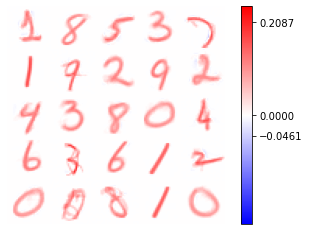

Adjusting learning rate of group 0 to 5.2000e-03.
Normalizations:  1.0091089  +-  0.037217565


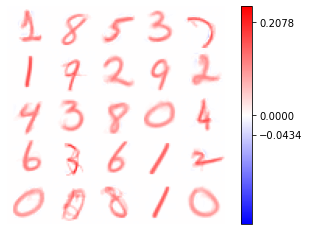

Normalizations:  1.0090017  +-  0.035661373


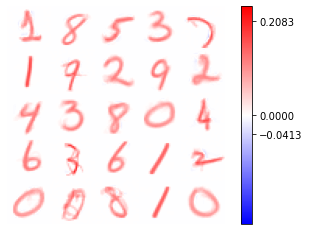

Adjusting learning rate of group 0 to 5.1000e-03.
Normalizations:  1.0089751  +-  0.0365833


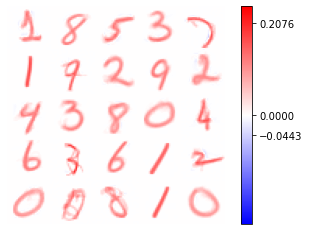

Normalizations:  1.0088581  +-  0.03528122


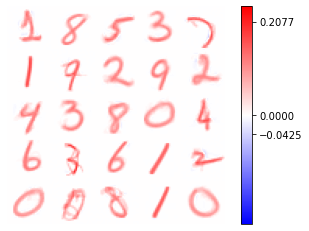

Adjusting learning rate of group 0 to 5.0000e-03.
Normalizations:  1.0087715  +-  0.035740882


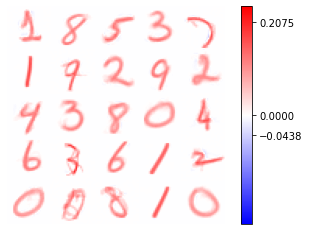

Normalizations:  1.0086833  +-  0.03431242


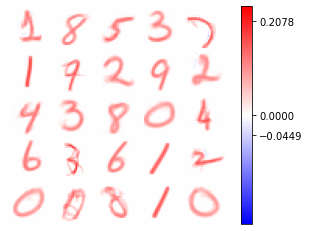

Adjusting learning rate of group 0 to 4.9000e-03.
Normalizations:  1.0086521  +-  0.03472234


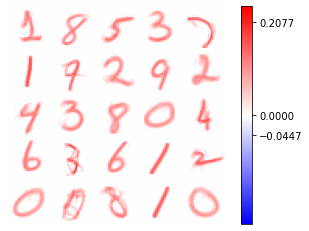

Normalizations:  1.0085512  +-  0.034720387


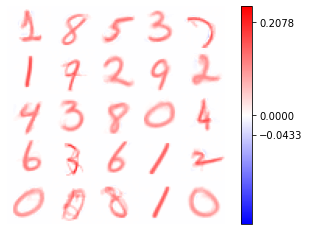

Adjusting learning rate of group 0 to 4.8000e-03.
Normalizations:  1.0084417  +-  0.03362916


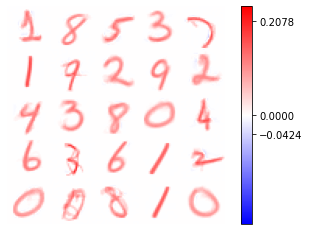

Normalizations:  1.0083438  +-  0.033623654


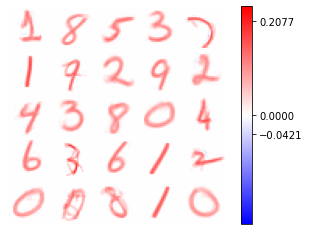

Adjusting learning rate of group 0 to 4.7000e-03.
Normalizations:  1.0082457  +-  0.032588586


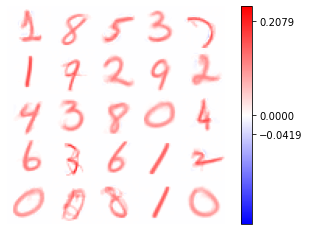

Normalizations:  1.0081917  +-  0.031679958


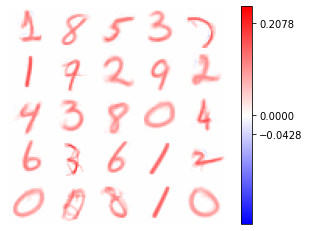

Adjusting learning rate of group 0 to 4.6000e-03.
Normalizations:  1.0081092  +-  0.031677324


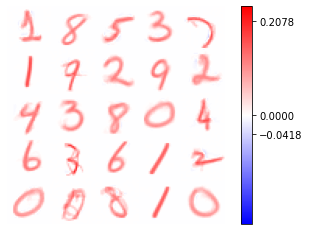

Normalizations:  1.0079843  +-  0.03166882


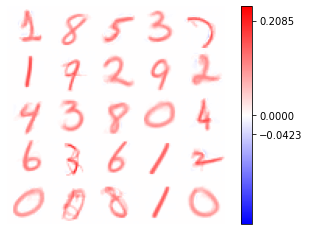

Adjusting learning rate of group 0 to 4.5000e-03.
Normalizations:  1.0079058  +-  0.03046178


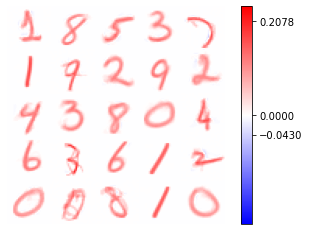

Normalizations:  1.0078075  +-  0.03071371


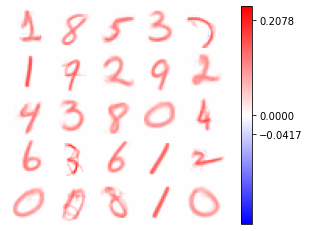

Adjusting learning rate of group 0 to 4.4000e-03.
Normalizations:  1.007704  +-  0.029764941


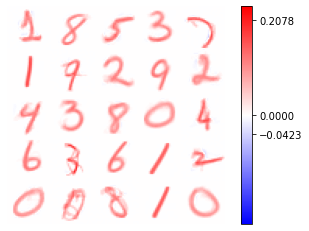

Normalizations:  1.0076385  +-  0.030104019


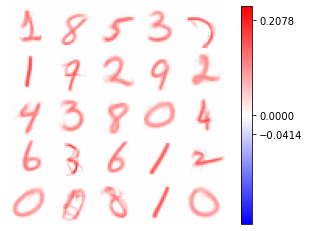

Adjusting learning rate of group 0 to 4.3000e-03.
Normalizations:  1.0075734  +-  0.029390726


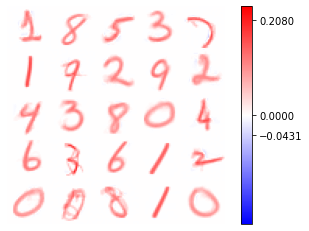

Normalizations:  1.0074903  +-  0.028511235


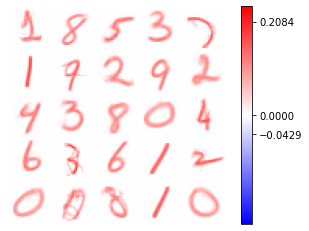

Adjusting learning rate of group 0 to 4.2000e-03.
Normalizations:  1.0074483  +-  0.028496178


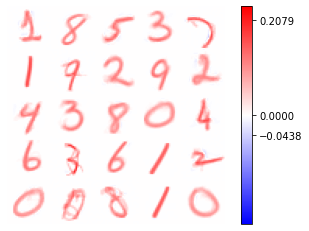

Normalizations:  1.0073637  +-  0.028841717


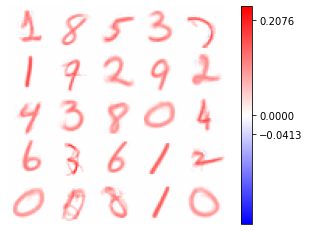

Adjusting learning rate of group 0 to 4.1000e-03.
Normalizations:  1.007261  +-  0.027994798


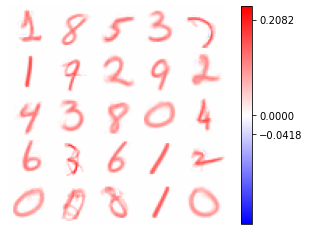

Normalizations:  1.0071285  +-  0.027036987


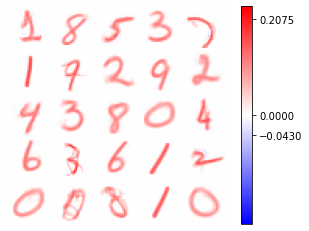

Adjusting learning rate of group 0 to 4.0000e-03.
Normalizations:  1.0070951  +-  0.027534569


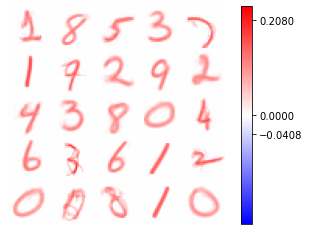

Normalizations:  1.0069915  +-  0.027789034


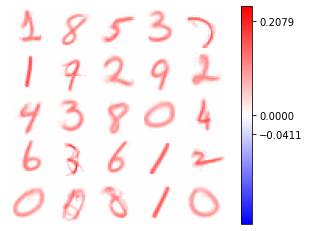

Adjusting learning rate of group 0 to 3.9000e-03.
Normalizations:  1.0069072  +-  0.02685096


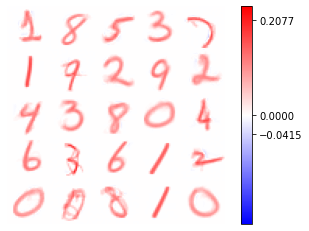

Normalizations:  1.0067878  +-  0.026219288


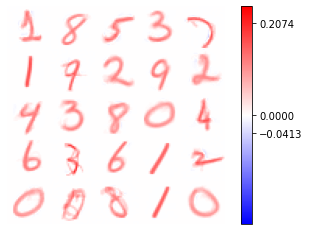

Adjusting learning rate of group 0 to 3.8000e-03.
Normalizations:  1.0067309  +-  0.0262095


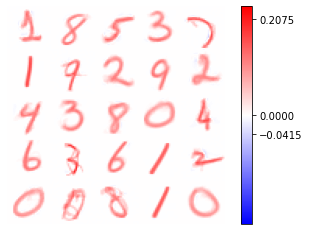

Normalizations:  1.006636  +-  0.026206471


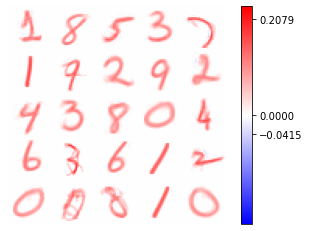

Adjusting learning rate of group 0 to 3.7000e-03.
Normalizations:  1.0065787  +-  0.025744244


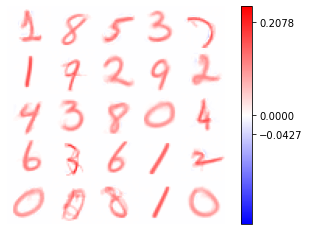

Normalizations:  1.0065094  +-  0.025232209


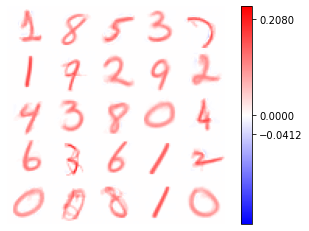

Adjusting learning rate of group 0 to 3.6000e-03.
Normalizations:  1.0064538  +-  0.02522404


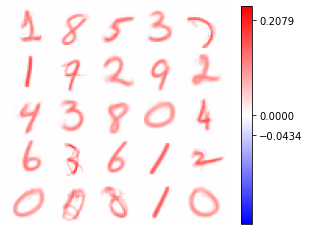

Normalizations:  1.0063423  +-  0.024477504


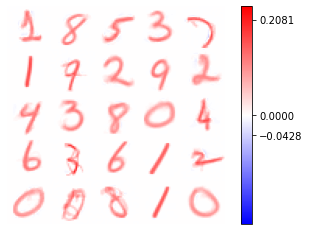

Adjusting learning rate of group 0 to 3.5000e-03.
Normalizations:  1.0063053  +-  0.024701292


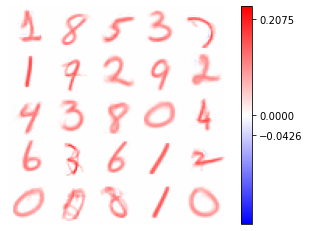

Normalizations:  1.0062579  +-  0.025057593


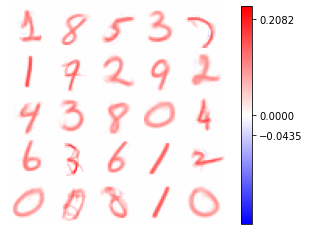

Adjusting learning rate of group 0 to 3.4000e-03.
Normalizations:  1.0061747  +-  0.024365164


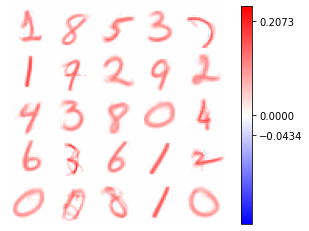

Normalizations:  1.006073  +-  0.023985807


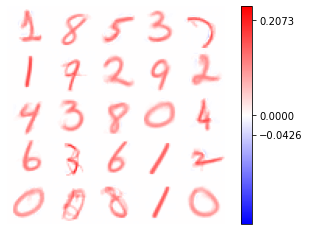

Adjusting learning rate of group 0 to 3.3000e-03.
Normalizations:  1.0060103  +-  0.023979822


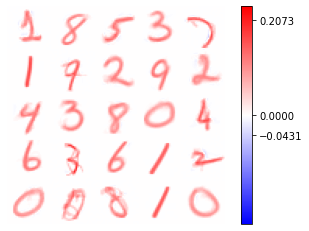

COMET ERROR: File could not be uploaded


Normalizations:  1.0059578  +-  0.024105633


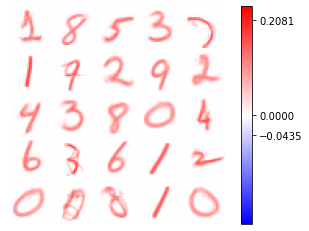

Adjusting learning rate of group 0 to 3.2000e-03.
Normalizations:  1.0058658  +-  0.02341877


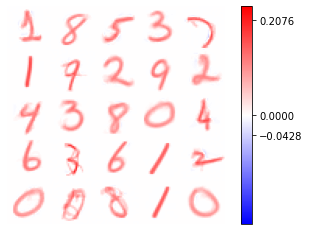

Normalizations:  1.0057845  +-  0.022981586


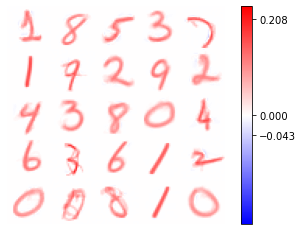

Adjusting learning rate of group 0 to 3.1000e-03.
Normalizations:  1.0057209  +-  0.023104707


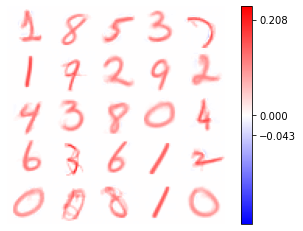

Normalizations:  1.0056074  +-  0.022638708


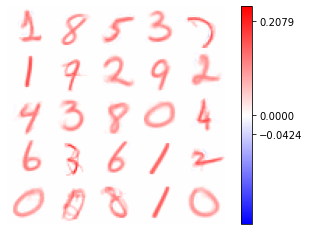

Adjusting learning rate of group 0 to 3.0000e-03.
Normalizations:  1.00555  +-  0.022638554


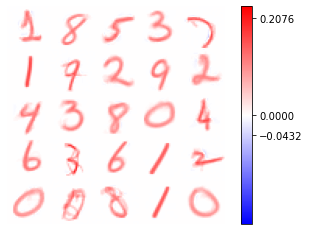

Normalizations:  1.0054628  +-  0.022154998


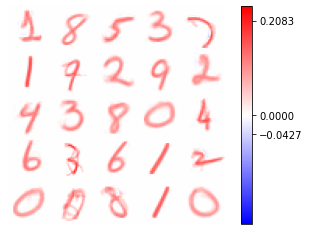

Adjusting learning rate of group 0 to 2.9000e-03.
Normalizations:  1.0053928  +-  0.022320852


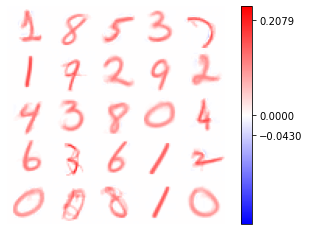

Normalizations:  1.0053108  +-  0.022482825


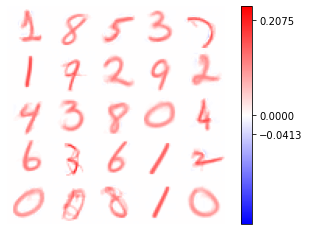

Adjusting learning rate of group 0 to 2.8000e-03.
Normalizations:  1.0052562  +-  0.021849342


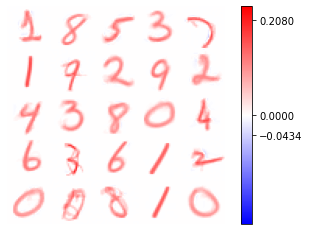

Normalizations:  1.0051893  +-  0.022148287


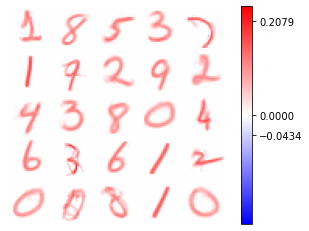

Adjusting learning rate of group 0 to 2.7000e-03.
Normalizations:  1.0051305  +-  0.021680014


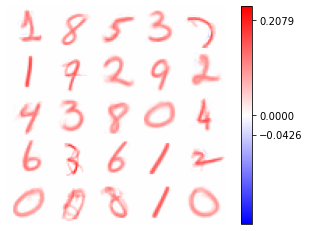

Normalizations:  1.0050541  +-  0.021816107


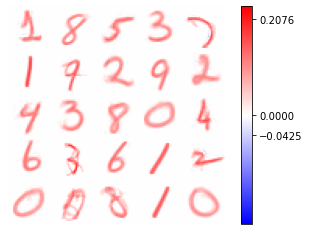

Adjusting learning rate of group 0 to 2.6000e-03.
Normalizations:  1.0049773  +-  0.021392178


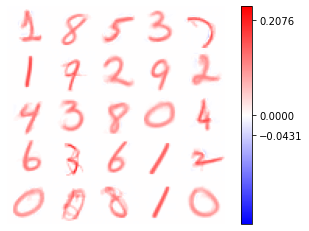

Normalizations:  1.0049049  +-  0.021391159


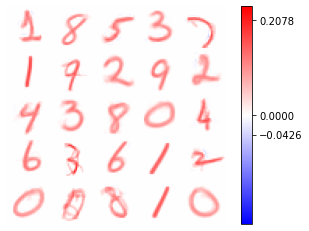

Adjusting learning rate of group 0 to 2.5000e-03.
Normalizations:  1.0048363  +-  0.02109472


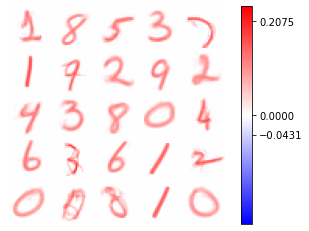

Normalizations:  1.004749  +-  0.020684307


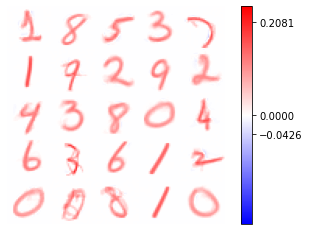

Adjusting learning rate of group 0 to 2.4000e-03.
Normalizations:  1.0046906  +-  0.020772438


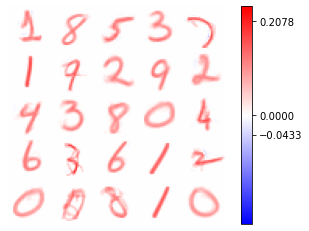

Normalizations:  1.004595  +-  0.020263538


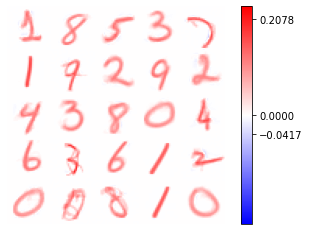

Adjusting learning rate of group 0 to 2.3000e-03.
Normalizations:  1.0045451  +-  0.020482678


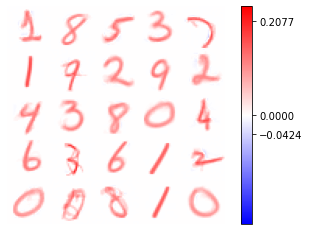

Normalizations:  1.0044814  +-  0.02059799


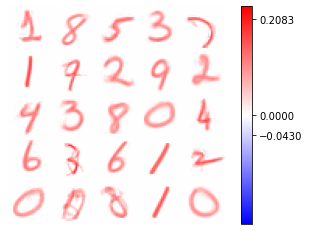

Adjusting learning rate of group 0 to 2.2000e-03.
Normalizations:  1.0044217  +-  0.020141417


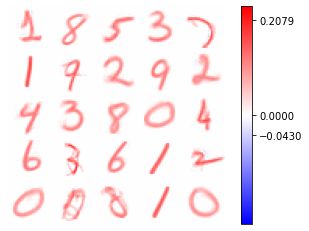

Normalizations:  1.0043483  +-  0.019749446


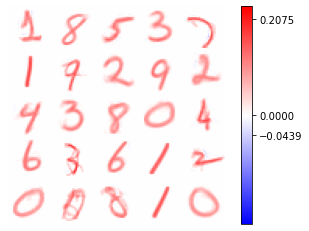

Adjusting learning rate of group 0 to 2.1000e-03.
Normalizations:  1.0042862  +-  0.019861536


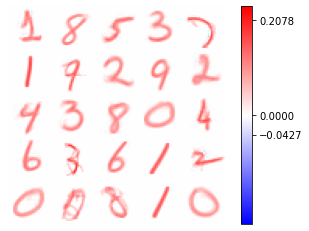

Normalizations:  1.004219  +-  0.019974224


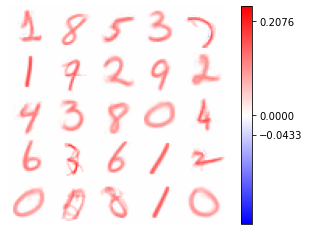

Adjusting learning rate of group 0 to 2.0000e-03.
Normalizations:  1.0041476  +-  0.019609326


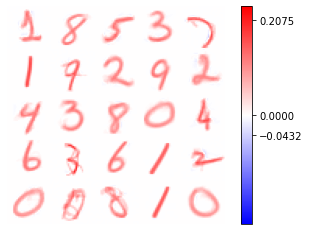

Normalizations:  1.0040767  +-  0.0192733


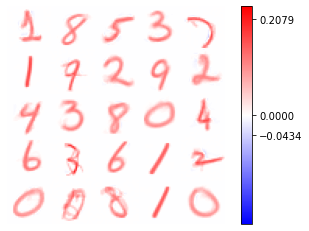

Adjusting learning rate of group 0 to 1.9000e-03.
Normalizations:  1.0040252  +-  0.019497002


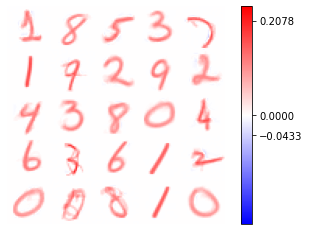

Normalizations:  1.0039598  +-  0.019497702


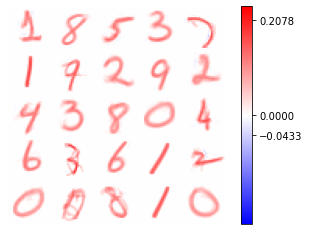

Adjusting learning rate of group 0 to 1.8000e-03.
Normalizations:  1.0038956  +-  0.01922649


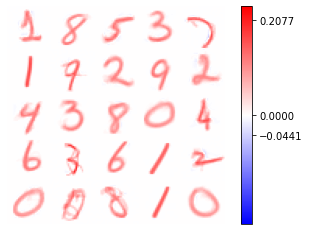

Normalizations:  1.0038289  +-  0.01922584


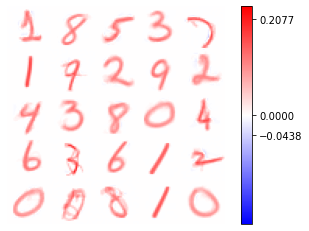

Adjusting learning rate of group 0 to 1.7000e-03.
Normalizations:  1.0037647  +-  0.019080345


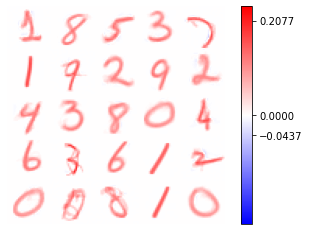

Normalizations:  1.0037  +-  0.019171642


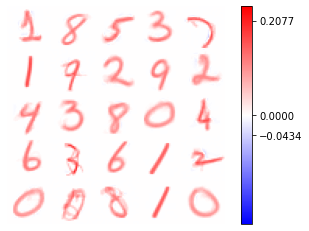

Adjusting learning rate of group 0 to 1.6000e-03.
Normalizations:  1.0036373  +-  0.018970016


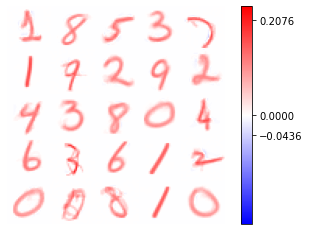

Normalizations:  1.0035672  +-  0.018693365


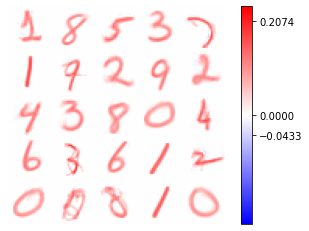

Adjusting learning rate of group 0 to 1.5000e-03.
Normalizations:  1.0035089  +-  0.01874874


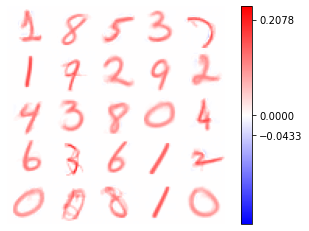

Normalizations:  1.0034391  +-  0.018749192


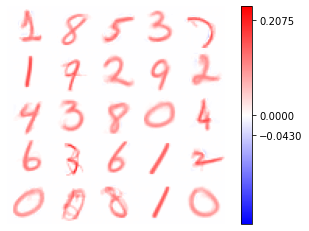

Adjusting learning rate of group 0 to 1.4000e-03.
Normalizations:  1.003377  +-  0.018430708


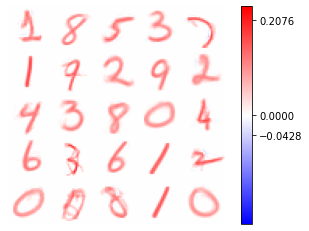

Normalizations:  1.0033187  +-  0.018571276


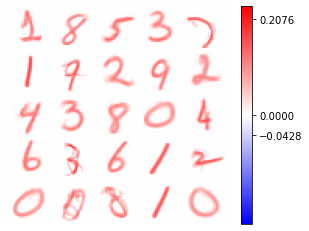

Adjusting learning rate of group 0 to 1.3000e-03.
Normalizations:  1.0032605  +-  0.01838735


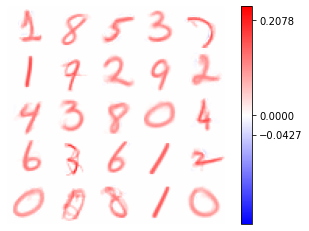

Normalizations:  1.0031972  +-  0.018298414


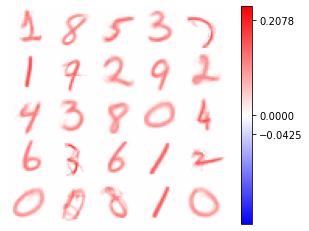

Adjusting learning rate of group 0 to 1.2000e-03.
Normalizations:  1.0031447  +-  0.018363826


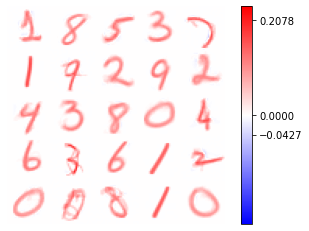

Normalizations:  1.0030862  +-  0.018445864


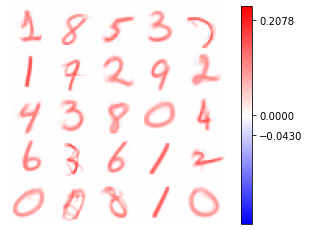

Adjusting learning rate of group 0 to 1.1000e-03.
Normalizations:  1.0030267  +-  0.018257784


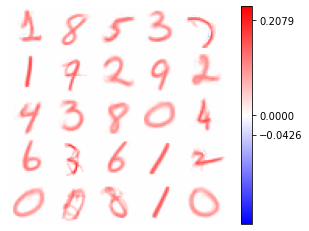

Normalizations:  1.0029696  +-  0.018296128


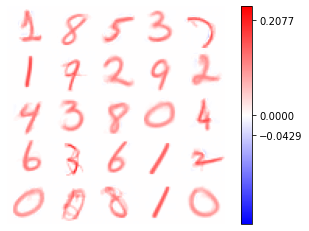

Adjusting learning rate of group 0 to 1.0000e-03.
Normalizations:  1.0029149  +-  0.01815333


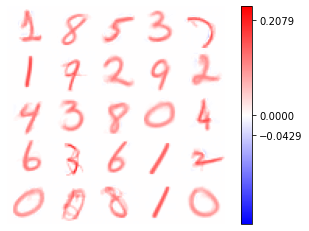

Normalizations:  1.0028614  +-  0.018203543


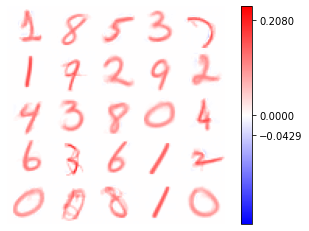

Adjusting learning rate of group 0 to 9.0000e-04.
Normalizations:  1.00281  +-  0.01806733


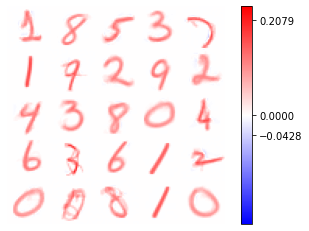

Normalizations:  1.0027544  +-  0.017899834


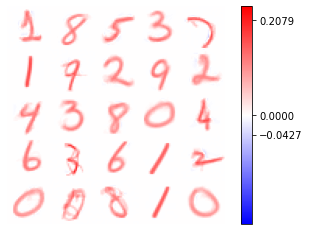

Adjusting learning rate of group 0 to 8.0000e-04.
Normalizations:  1.0027076  +-  0.017945716


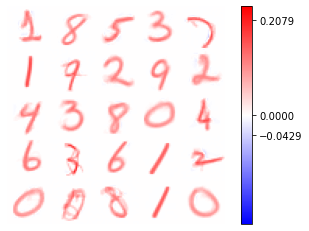

Normalizations:  1.0026561  +-  0.01785927


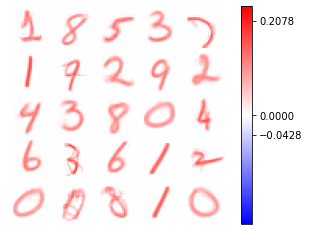

Adjusting learning rate of group 0 to 7.0000e-04.
Normalizations:  1.0026098  +-  0.01785973


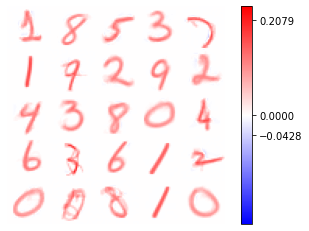

Normalizations:  1.0025645  +-  0.017900176


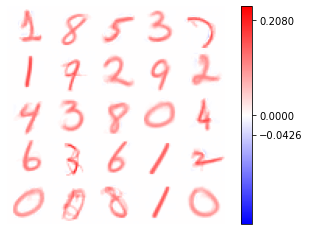

Adjusting learning rate of group 0 to 6.0000e-04.
Normalizations:  1.0025191  +-  0.017799329


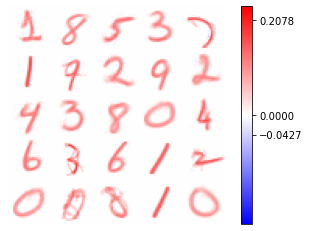

Normalizations:  1.0024761  +-  0.017760424


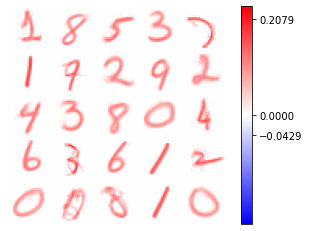

Adjusting learning rate of group 0 to 5.0000e-04.
Normalizations:  1.0024362  +-  0.017761104


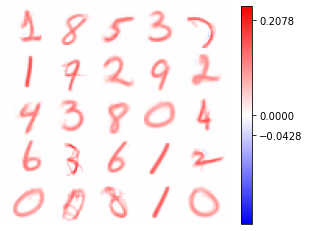

Normalizations:  1.0023983  +-  0.017761935


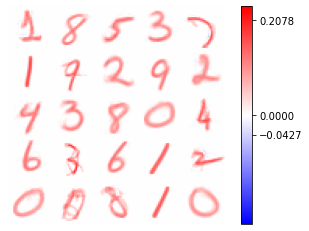

Adjusting learning rate of group 0 to 4.0000e-04.
Normalizations:  1.0023602  +-  0.017677976


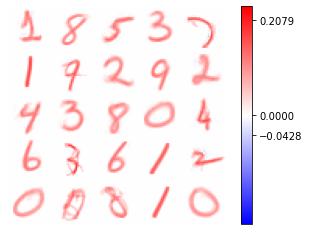

Normalizations:  1.0023264  +-  0.017641904


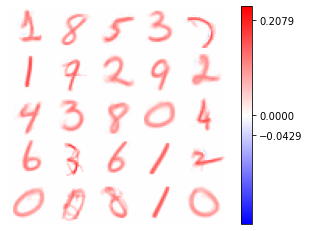

Adjusting learning rate of group 0 to 3.0000e-04.
Normalizations:  1.0022947  +-  0.017642565


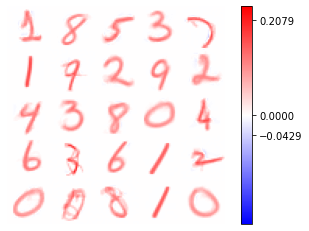

Normalizations:  1.0022674  +-  0.017624578


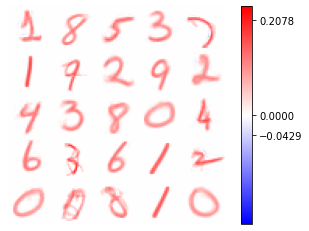

Adjusting learning rate of group 0 to 2.0000e-04.
Normalizations:  1.0022414  +-  0.017625233


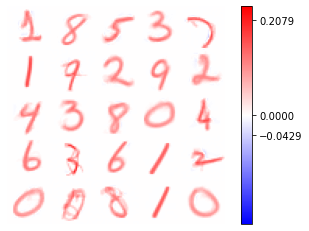

Normalizations:  1.0022215  +-  0.017625837


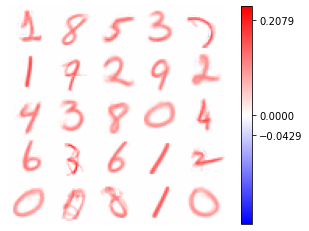

Adjusting learning rate of group 0 to 1.0000e-04.
Normalizations:  1.0022018  +-  0.017608024


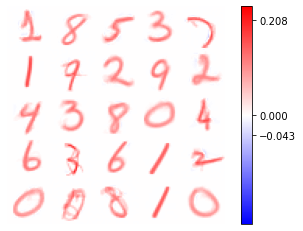

Normalizations:  1.0021905  +-  0.017590232


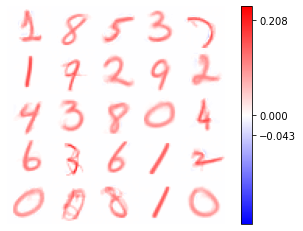

COMET INFO: ---------------------------
COMET INFO: Comet.ml Experiment Summary
COMET INFO: ---------------------------
COMET INFO:   Data:
COMET INFO:     display_summary_level : 1
COMET INFO:     url                   : https://www.comet.ml/einlar/qlsproject/c689ccb367f14ebe8b2c9554ff2a56de
COMET INFO:   Others:
COMET INFO:     Name : boh3
COMET INFO:   Parameters:
COMET INFO:     arch          : Net(
  (hidden): Linear(in_features=784, out_features=2000, bias=False)
  (top): Linear(in_features=2000, out_features=10, bias=False)
)
COMET INFO:     beta          : 0.1
COMET INFO:     delta         : 0.4
COMET INFO:     lebesgue_p    : 2
COMET INFO:     n             : 4.5
COMET INFO:     ranking_param : 2
COMET INFO:   Uploads [count]:
COMET INFO:     environment details : 1
COMET INFO:     figures [400]       : 400
COMET INFO:     filename            : 1
COMET INFO:     installed packages  : 1
COMET INFO:     model graph         : 1
COMET INFO:     notebook            : 1
COMET INFO: 

Adjusting learning rate of group 0 to 0.0000e+00.


COMET INFO: Uploading metrics, params, and assets to Comet before program termination (may take several seconds)
COMET INFO: The Python SDK has 3600 seconds to finish before aborting...
COMET INFO: Waiting for completion of the file uploads (may take several seconds)
COMET INFO: The Python SDK has 10800 seconds to finish before aborting...
COMET INFO: Still uploading 2 file(s)


1

In [12]:
trainer.fit(full_system, mnist) #Run training!
#After every epoch, "Normalizations" are printed. These are mean and stdev of \sum_j |W_{ij}|^p.
#When the model converges, mean -> 1 (homeostatic constraint, with R=1)

In [13]:
torch.save(next(net.parameters()), "weights")

In [ ]:
#Save model after training
now = datetime.now()
date_time_string = now.strftime("%d_%m_%Y-%H_%M")

checkpoint_name = f"checkpoints/Unsupervised-p{update_weights_rule.lebesgue_p}-k{update_weights_rule.ranking_param}-delta{update_weights_rule.delta}_{date_time_string}.ckpt"
trainer.save_checkpoint(checkpoint_name) #Move to models/biolearning_mnist_fully_connected

print(f"Checkpoint saved to {checkpoint_name}")

torch.save(full_system.model.state_dict(), 'models/biolearning_mnist_fully_connected/unsupervised_weights_paper.pth') #Save only state_dict